<a href="https://colab.research.google.com/github/sperezp23/Shimoku_prueba_tecnica/blob/main/PruebaTecnicaShimoku.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Prueba Tecnica Shimoku: Analista de datos**<br>

**Objetivo:** Partiendo de los dataset leads.csv y offers.csv desarrollar un modelo de Maching Learning que clacifique a las personas de acuerdo a su potencial como clientes.<br><br>  

Por: Santiago Pérez Puerta.<br><br>

<p><a name="contenido"></a></p>

# **Contenido:**
- <a href="#Librerias">Librerías implementadas</a><br>
- <a href="#leads_df">Leads_df</a><br>
- <a href="#offers_df">Offers_df</a><br>
- <a href="#union">Unión de las bases de datos</a><br>
- <a href="#modelo">Modelo</a><br>
- <a href="#sdk">SDK</a><br>

<p><a name="Librerias"></a></p>

# **Librerías / Repositorios de Github.**

<a href="#contenido">Volver al contenido</a><br>

Para comenzar, se importan las librearías necesarias, se cargan los dataset y se importa el repositorio de github MLutilities, el cual cuenta con un grupo diverso de codigos utilies para el analisis exploratorio de datos.

In [75]:
# Repositorio de Github MLutilities
%%capture
!pip install git+https://github.com/omarcastano/MLutilities.git

In [76]:
# Librarías
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as subplots

from mlutilities.eda.multivariant_widget import cramerv_widget

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.tree import DecisionTreeClassifier

# Estilos de seaborn
sns.set()

Tras finalizar los preparativos iniciales, se procede con el analisis de la información. Ya que, no se posee un contexto detallado del origen de los datos, en primera instancia se desarrollará un analisis por separado de ambos datasets. Esto ultimo, con el fin de obtener un mejor entendimiento de los dataset, antes de incurrir en procesos complejos como la union de las bases de datos.

<p><a name="leads_df"></a></p>

#**Leads_df**

<a href="#contenido">Volver al contenido</a><br>

**Contenido**
- <a href="#leads_AED">Analisis exploratorio</a><br>
- <a href="#perfil">Perfil de quiern se ha convertido</a><br>
- <a href="#fechas_leads">Filtrado por fechas</a><br>
- <a href="#rela_var_leads">Relación entre variables</a><br>

A continuación, se presenta de manera seccionada el tratamiento al que se sometió el dataset Leads. El cual consistió en un primer analis exploratorio de las variables presentadas, para luego continuar con la formulación del perfil de los compradores convertidos, un filtrado por fechas de la información, y finalmente el calculo de la correlación entre las variables presentadas.

<p><a name="leads_AED"></a></p>

##**Analisis exploratorio**

<a href="#leads_df">Volver a Leads_df</a><br>

Para dar inicio al analis exploratorio (AE) primero se carga el dataset.



In [ ]:
# Carga del dataset Leads
leads_df = pd.read_csv('/content/Copia de leads.csv')
leads_df.head()

Una vez que se ha llevado a cabo una primera inspección visual de la información, se modifican los titulos de las columnas con el fin de que se facilite la escritura del codigo a desarrollar.

In [78]:
# Modificacion de los titulos para ajilizar el analisis
leads_df.columns = leads_df.columns.str.strip().str.lower().str.replace(' ','_').str.replace('/','_')
leads_df.sample(5)

,id,first_name,use_case,source,status,discarded_nurturing_reason,acquisition_campaign,created_date,converted,city
10385,uaa5q29a,Quinn12 White17,Corporate Events,Outbound,Nurturing,Wrong Data,NaN,2019-01-30,0,Jacksonville
14746,25ddvihj,Jordan8 Robinson8,Corporate Events,Inbound,Nurturing,Unreachable,Follow-up: digital guide 2,2019-09-26,0,Austin
32476,s552kj5q,Drew15 Smith5,Corporate Events,Outbound,Discarded,Not Target,NaN,2019-05-21,0,NaN
53406,fcyh3oql,Avery14 Taylor1,NaN,Inbound,Nurturing,Unreachable,Digital kit,2019-11-11,0,Chicago
45859,n1z29xn6,Jordan10 White19,NaN,Inbound,Nurturing,Not feeling,NaN,2019-09-17,0,Chicago


Continuando, se realizan los primeros pasos para tener un contexto más amplio de la información que se está manejando y la integridad de la misma. Para ello se determina el numero de variables y registros presentes en la base de datos, el tipo de datos con los que se está trabajando, la cantidad de valores nulos presentes en cada columna, se verifica si hay presencia de registros duplicados que deban ser tratados, y se finaliza con un reconteo del numero de registros presente en la base de datos. Luego, se llevan a cabo procesos típicos de estadistica descriptiva para conocer más a fondo el comportamiento de los datos y su importancia para el perfilamiento de los clientes potenciales (Leads).  

In [79]:
# Cantidad de variables y registros
filas,columnas = leads_df.shape
print(f'Registros: {filas}\nVariables: {columnas}')

Registros: 61639
Variables: 10


In [80]:
# Tipo de datos presentes en el dataset
leads_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61639 entries, 0 to 61638
Data columns (total 10 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   id                          43972 non-null  object
 1   first_name                  53240 non-null  object
 2   use_case                    44918 non-null  object
 3   source                      60293 non-null  object
 4   status                      61639 non-null  object
 5   discarded_nurturing_reason  45169 non-null  object
 6   acquisition_campaign        25047 non-null  object
 7   created_date                61639 non-null  object
 8   converted                   61639 non-null  int64 
 9   city                        34929 non-null  object
dtypes: int64(1), object(9)
memory usage: 4.7+ MB


Las siguientes dos lineas de codigo determinan el numero de valores nulos y el procentaje de los mismos respecto al total, en cada columna de la base de datos, esto ultimo con el objetivo de descartar variables que contengan demaciados valores nulos.

In [81]:
# Conteo de valores nulos o NaN, en cantidad y en porcentaje
print(f'Numero de valores nulos:\n{leads_df.isna().sum()}\n{"-"*60}\n\nPorcentaje de valores nulos:\n{(leads_df.isna().sum())/filas}')

Numero de valores nulos:
id                            17667
first_name                     8399
use_case                      16721
source                         1346
status                            0
discarded_nurturing_reason    16470
acquisition_campaign          36592
created_date                      0
converted                         0
city                          26710
dtype: int64
------------------------------------------------------------

Porcentaje de valores nulos:
id                            0.286620
first_name                    0.136261
use_case                      0.271273
source                        0.021837
status                        0.000000
discarded_nurturing_reason    0.267201
acquisition_campaign          0.593650
created_date                  0.000000
converted                     0.000000
city                          0.433330
dtype: float64


Llegados a este punto, se analiza el dataset en busca de registros completos duplicados que seban ser eliminados, esto con el fin de evitar la redundancia de la información, lo cual puede derivar en calculos estadisticos sesgados, desequilibrios en los datos a la hora de entrenar el modelo, etc.

In [82]:
# Conteo de registros duplicados
leads_df.duplicated().value_counts()

False    60063
True      1576
dtype: int64

In [83]:
# Visualización de registros duplicados
leads_df[leads_df.duplicated()]

,id,first_name,use_case,source,status,discarded_nurturing_reason,acquisition_campaign,created_date,converted,city
34,NaN,NaN,Sports Events,Inbound,Discarded,Not Target,NaN,2018-10-17,0,NaN
48,NaN,NaN,Sports Events,Inbound,Discarded,Not Target,NaN,2018-01-01,0,NaN
99,NaN,NaN,Sports Events,Inbound,Discarded,Not Target,NaN,2018-01-01,0,NaN
149,NaN,NaN,Sports Events,Inbound,New,NaN,NaN,2019-04-28,0,NaN
194,NaN,NaN,Sports Events,Inbound,New,NaN,NaN,2019-04-28,0,NaN
...,...,...,...,...,...,...,...,...,...,...
61429,NaN,NaN,Corporate Events,Inbound,Qualified,NaN,NaN,2020-09-26,1,NaN
61477,NaN,NaN,Sports Events,Inbound,Discarded,Not Target,NaN,2020-09-26,0,NaN
61479,NaN,NaN,Sports Events,Inbound,Discarded,Duplicate/Test,NaN,2020-09-26,0,NaN
61515,NaN,NaN,Sports Events,Inbound,Nurturing,Not the right moment,NaN,2020-09-26,0,NaN


In [84]:
# Eliminación de los duplicados
leads_df.drop_duplicates(inplace=True)
leads_df.sample(5)

,id,first_name,use_case,source,status,discarded_nurturing_reason,acquisition_campaign,created_date,converted,city
283,t9nfagpd,NaN,Corporate Events,Inbound,Qualified,NaN,NaN,2018-10-20,1,Jacksonville
46152,1tk3ntex,Devon13 Moore17,Corporate Events,Outbound,Nurturing,Not Fit,VirtualMeetups,2019-09-21,0,Fort Worth
53573,2xqfvw9w,Rowan3 Smith18,Corporate Events,Inbound,Qualified,NaN,ArtFair,2019-11-12,1,Phoenix
57028,r4q947rp,Devon9 Harris10,Corporate Events,Outbound,Discarded,Not feeling,VirtualMeetups,2019-11-07,0,Washington
52074,0i7pehgb,Skyler15 Jones20,Corporate Events,Outbound,Nurturing,Competitor,VirtualMeetups,2019-08-06,0,Jacksonville


In [85]:
# Reconteo del duplicados
leads_df.duplicated().value_counts()

False    60063
dtype: int64

Para continuar con la verificación de la integridad de la información, se realiza una inspección de los valores únicos de cada columna, esto con el fin de verificar la limpieza de los datos partiendo del supuesto de que en una variable como lo puede ser el ID es normal encontrar una alta variedad de datos, sin embargo, para una columna como lo pueden ser Converted o City, lo esperado es ver un numero de valores unicos realativamente pequeño.

In [86]:
# Registros unicos de cada columna
columnas = leads_df.columns[2:].drop(['created_date'])
for columna in columnas:
  print(f'{leads_df[columna].value_counts()}\n{"-"*60}\n')

Corporate Events          30455
Sports Events              7321
Educational Seminars       3863
Wedding Planning           1648
Concerts and festivals       68
Name: use_case, dtype: int64
------------------------------------------------------------

Inbound             37788
Outbound            21438
Bot-Intercom           28
Mail                    7
Intercom                2
Llamada entrante        1
Name: source, dtype: int64
------------------------------------------------------------

Nurturing    23905
Discarded    19909
Qualified     5766
New           3234
Called        2945
Engaged       1813
Contacted      980
Meeting        576
Linkedin       492
Email          390
Recicled        41
Call            12
Name: status, dtype: int64
------------------------------------------------------------

Not Target              12107
Not the right moment     8599
Unreachable              8100
Not feeling              4025
Wrong Data               3690
Not Fit                  3577
Competi

Ahora que no hay presencia de registros duplicados, y se tiene certeza de la calidad de la información, se lleva a cabo el ánalis estadistico de acuerdo al tipo de variables (Categoricas o numericas). Para comenzar, se hace uso del medoto describe en cada columna del dataset para determinar las propiedades estadisticas que suelen ser más reelevantes para un AE (esto ultimo segun el tipo de variable).

In [87]:
# Estadistica descriptiva de cada columna
variables_categoricas = leads_df.columns[2:]

for variable in variables_categoricas:
  print(f'{leads_df[variable].describe()}\n{"-"*60}')

count                43355
unique                   5
top       Corporate Events
freq                 30455
Name: use_case, dtype: object
------------------------------------------------------------
count       59264
unique          6
top       Inbound
freq        37788
Name: source, dtype: object
------------------------------------------------------------
count         60063
unique           12
top       Nurturing
freq          23905
Name: status, dtype: object
------------------------------------------------------------
count          44435
unique            13
top       Not Target
freq           12107
Name: discarded_nurturing_reason, dtype: object
------------------------------------------------------------
count              25035
unique                71
top       VirtualMeetups
freq                5884
Name: acquisition_campaign, dtype: object
------------------------------------------------------------
count          60063
unique           591
top       2019-06-29
freq        

Continuando con el análisis estadistico, se procede con el grafico de las varaibles que en primera instancia se pensaría son las más reelevantes para el modelo de clacificación.

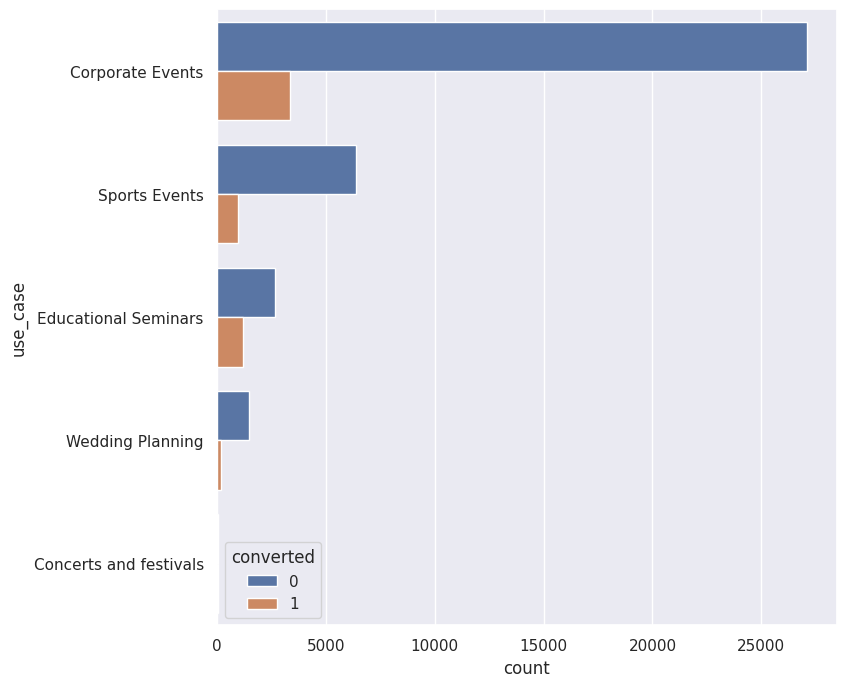

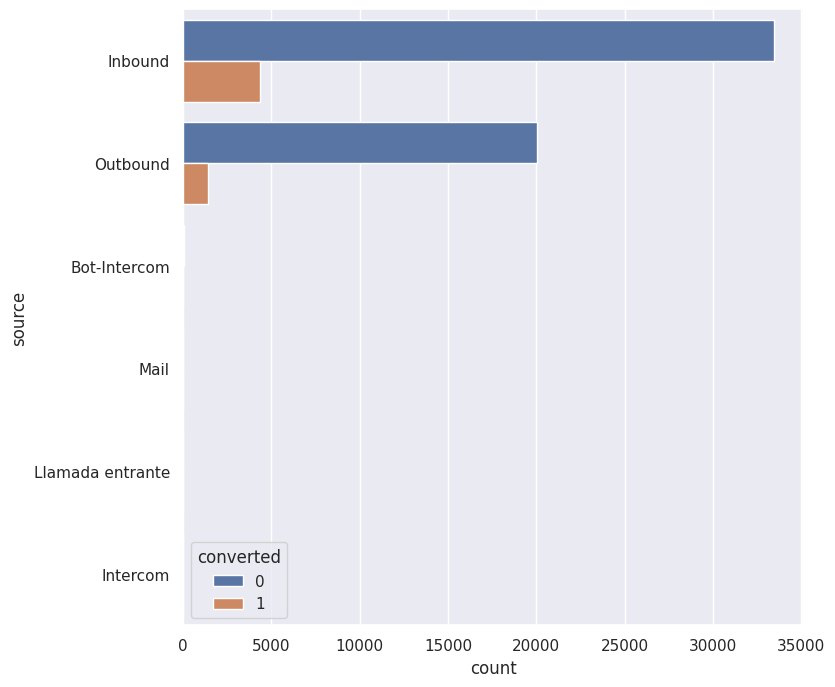

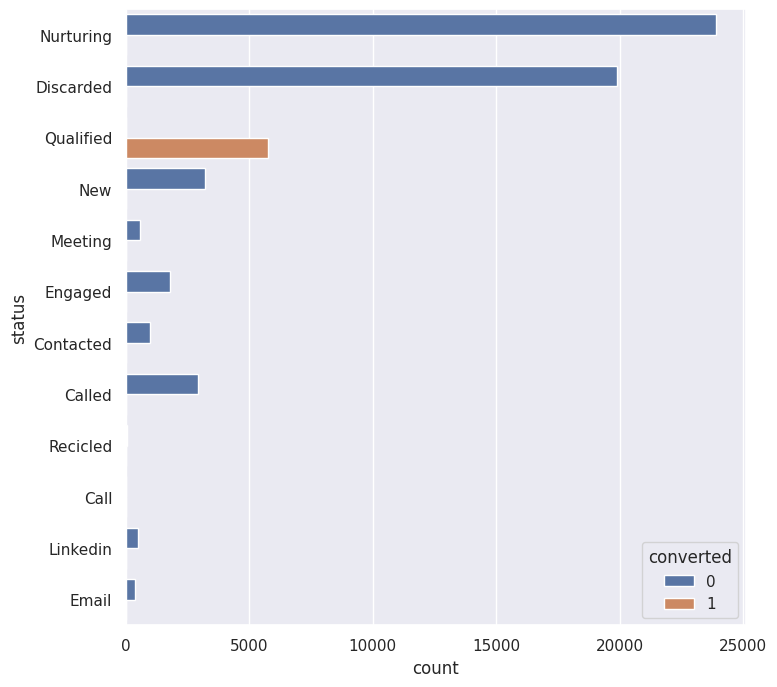

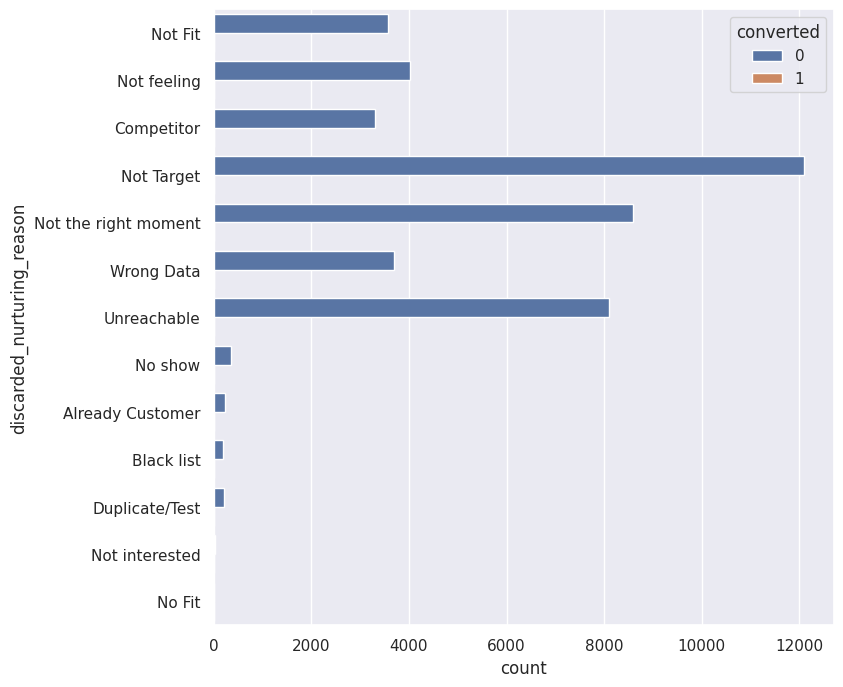

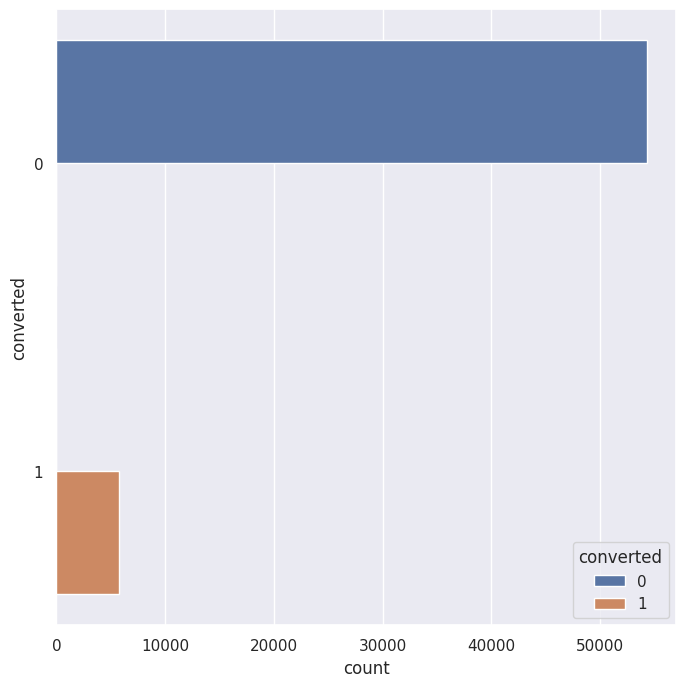

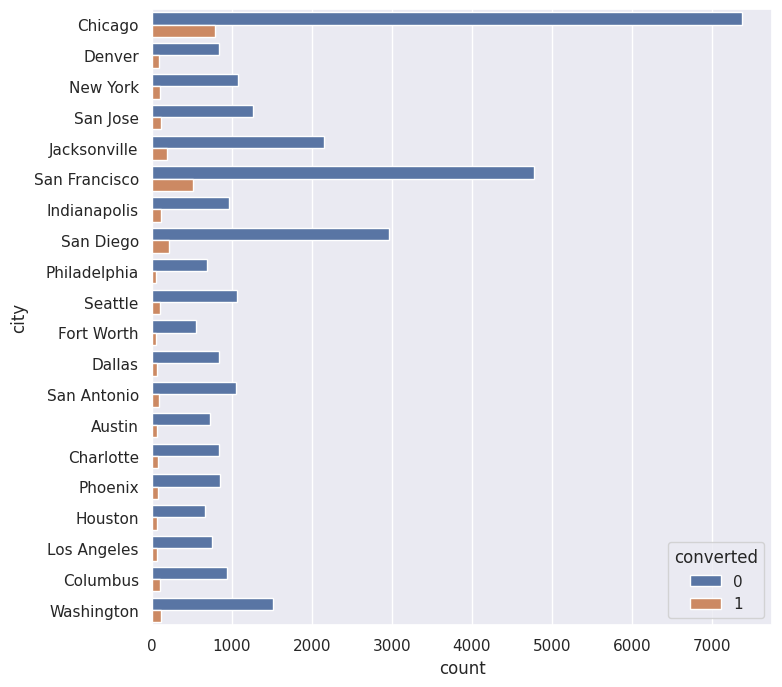

In [88]:
# Graficos de conteo de las variables categoricas reelevantes
variables_categoricas = leads_df.columns[2:].drop(['created_date','acquisition_campaign'])
for variable in variables_categoricas:
  plt.figure(figsize=(8,8))
  sns.countplot(leads_df,y=variable, hue='converted');
  plt.show();

Las graficas del las variavles Acquisition campaign y Created date se llevaron a cavo haciendo uso de la librería Plotly, ya que, esta misma facilita la creación de graficas de variables con un numero elevado de valores unicos sin comprometar su legibilidad.

In [89]:
# Histograma de la variable Acquisition campaign
px.histogram(leads_df,x='acquisition_campaign')

In [90]:
# Histograma de la variable created_date
px.histogram(leads_df,x='created_date')

<p><a name="perfil"></a></p>

## **Perfil de quien se ha convertido**

<a href="#leads_df">Volver a Leads_df</a><br>

A continuación, para tener mayor certeza de la variables que fungen en favor del que una persona se convierta en un nuevo cliente, se realiza un filtrado de la base de datos, de modo que el dataset resultante contenga solo la información de aquellas personas que se adquirieron los productos y servicos de la organización. El analisis de dicha información podría mostrar patrones, tendencias, o similitudes entre los registros que permitan estimar que variables será determinantes para el modelo de clacificación.

Por otro lado, respecto al perfil del cliente potencial, si se basa solo en la moda de las variables para construir lo, se puede destacar lo siguiente:

1.   Busca el software para eventos corporativos **(use_case)**.

2.   Llegó a la empreza en busqueda de soluciones **(source)**.

3.   Es un cliente que se ha informado y conoce lo que la organización tiene para ofrecerle, y sabe que la misma puede ofrecerle una solución concreta de su problema **(status)**.

4.   Asistió a los Meetups virtuales **(acquisition_campaign)**.

5.   Es antiguo cliente **(discarded_nurturing_reason)**.

6.   Vive en chicago **(City)**.



In [91]:
# Vista de leads_df sin filtrar
leads_df.sample(10)

,id,first_name,use_case,source,status,discarded_nurturing_reason,acquisition_campaign,created_date,converted,city
52816,5zrtl8ju,Taylor5 Jones5,Corporate Events,Outbound,Called,NaN,Corporate Connect,2019-11-09,0,San Diego
57814,NaN,Jamie18 Johnson2,Educational Seminars,Inbound,New,NaN,Home,2019-12-12,0,NaN
48295,0hyskys8,Jordan20 Miller19,Corporate Events,Inbound,Nurturing,Not the right moment,Digital kit 4,2019-09-05,0,NaN
37833,p76x16e1,Robin19 Harris15,Corporate Events,Outbound,Nurturing,Unreachable,VirtualMeetups,2019-08-02,0,San Diego
54752,NaN,Jordan2 Jackson2,Sports Events,Inbound,New,NaN,Home,2019-11-18,0,NaN
27474,uzxk4tua,NaN,NaN,Inbound,Nurturing,Unreachable,NaN,2018-09-24,0,Indianapolis
38281,NaN,Riley3 Davis2,NaN,Inbound,Nurturing,Not the right moment,TechEvent,2019-12-02,0,NaN
16269,NaN,Robin18 Williams7,NaN,Inbound,Nurturing,Not Target,Event Management Guide,2018-07-25,0,NaN
58226,NaN,NaN,Sports Events,Inbound,Discarded,Wrong Data,NaN,2019-12-15,0,NaN
9854,NaN,Frankie12 Thompson16,Sports Events,Inbound,Discarded,Not Target,NaN,2018-12-30,0,NaN


In [92]:
# Vista de leads_df filtrado
converted_df = leads_df[leads_df.converted == 1]
converted_df.sample(5)

,id,first_name,use_case,source,status,discarded_nurturing_reason,acquisition_campaign,created_date,converted,city
33400,2b3l67w5,Harper8 Harris3,Corporate Events,Outbound,Qualified,NaN,NaN,2019-06-01,1,Chicago
21928,NaN,NaN,Corporate Events,Inbound,Qualified,NaN,VirtualMeetups,2019-01-26,1,Chicago
412,NaN,NaN,Corporate Events,Inbound,Qualified,NaN,Corporate Event Guide A,2018-10-20,1,NaN
30538,mjhc3z55,Charlie5 Martin3,Corporate Events,Inbound,Qualified,NaN,NaN,2018-12-29,1,NaN
12268,rlll96s9,NaN,Sports Events,Inbound,Qualified,NaN,NaN,2018-12-25,1,Washington


In [93]:
# Cantidad de variables y registros
filas,columnas = leads_df.shape
print(f'Registros: {filas}\nVariables: {columnas}')

Registros: 60063
Variables: 10


In [94]:
# Numero de registros duplicados
leads_df.duplicated().value_counts()

False    60063
dtype: int64

In [95]:
# Numero de valores nulos
print(f'Numero de valores nulos:\n{converted_df.isna().sum()}\n{"-"*60}\n\nPorcentaje de valores nulos:\n{converted_df.isna().sum()/filas}')

Numero de valores nulos:
id                            1798
first_name                    1095
use_case                        83
source                          28
status                           0
discarded_nurturing_reason    5719
acquisition_campaign          4328
created_date                     0
converted                        0
city                          2744
dtype: int64
------------------------------------------------------------

Porcentaje de valores nulos:
id                            0.029935
first_name                    0.018231
use_case                      0.001382
source                        0.000466
status                        0.000000
discarded_nurturing_reason    0.095217
acquisition_campaign          0.072058
created_date                  0.000000
converted                     0.000000
city                          0.045685
dtype: float64


In [96]:
# Registros unicos de cada columna
columnas = converted_df.columns[2:].drop(['converted','created_date'])
for columna in columnas:
  print(f'{converted_df[columna].value_counts()}\n{"-"*60}\n')

Corporate Events          3337
Educational Seminars      1188
Sports Events              952
Wedding Planning           173
Concerts and festivals      35
Name: use_case, dtype: int64
------------------------------------------------------------

Inbound         4347
Outbound        1385
Bot-Intercom       5
Mail               3
Name: source, dtype: int64
------------------------------------------------------------

Qualified    5765
Meeting         3
Name: status, dtype: int64
------------------------------------------------------------

Already Customer        10
Duplicate/Test          10
No show                  7
Not Target               6
Not the right moment     5
Wrong Data               3
Unreachable              3
Not Fit                  2
Not interested           1
Not feeling              1
Competitor               1
Name: discarded_nurturing_reason, dtype: int64
------------------------------------------------------------

VirtualMeetups                449
EducationExpo 2 

In [97]:
# Estadistica descriptiva de cada variable
variables_categoricas = converted_df.columns[2:].drop('converted')

for variable in variables_categoricas:
  print(f'{converted_df[variable].describe()}\n{"-"*60}')

count                 5685
unique                   5
top       Corporate Events
freq                  3337
Name: use_case, dtype: object
------------------------------------------------------------
count        5740
unique          4
top       Inbound
freq         4347
Name: source, dtype: object
------------------------------------------------------------
count          5768
unique            2
top       Qualified
freq           5765
Name: status, dtype: object
------------------------------------------------------------
count                   49
unique                  11
top       Already Customer
freq                    10
Name: discarded_nurturing_reason, dtype: object
------------------------------------------------------------
count               1440
unique                47
top       VirtualMeetups
freq                 449
Name: acquisition_campaign, dtype: object
------------------------------------------------------------
count           5768
unique           584
top      

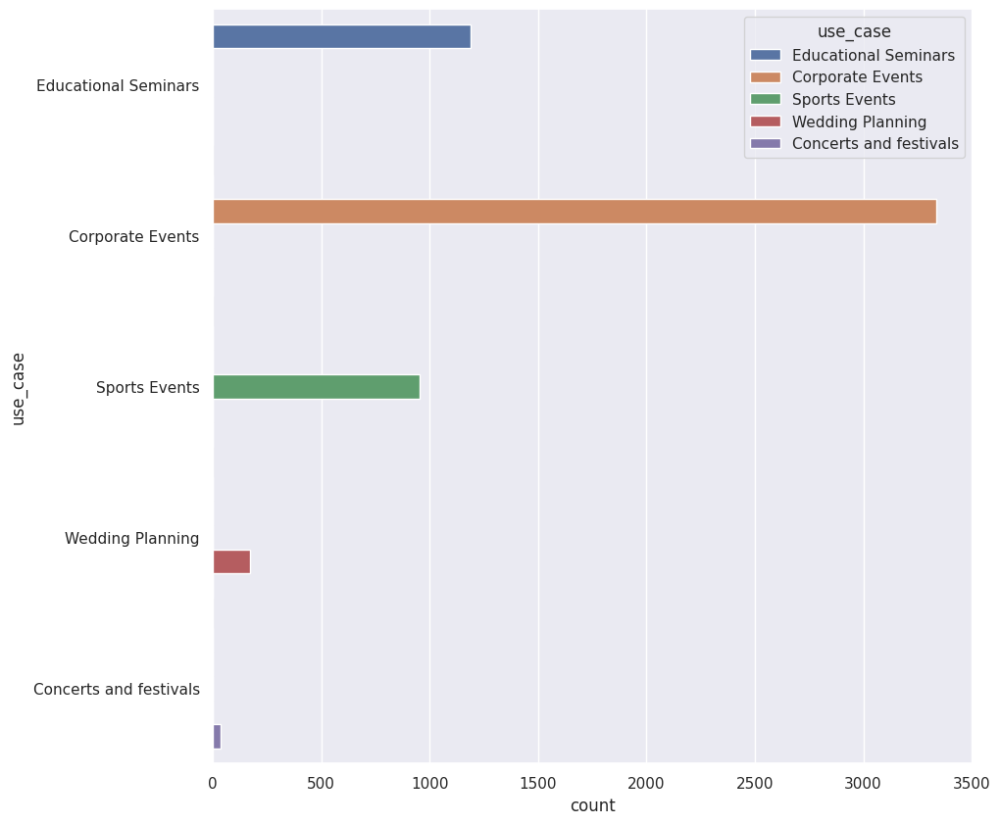

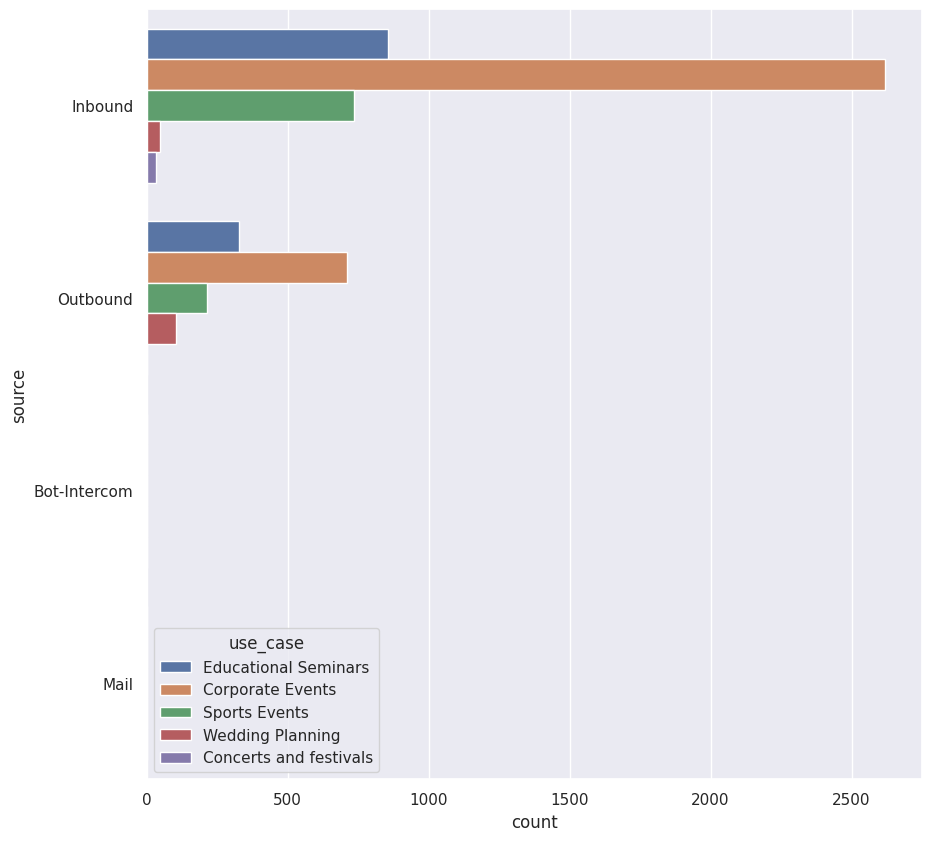

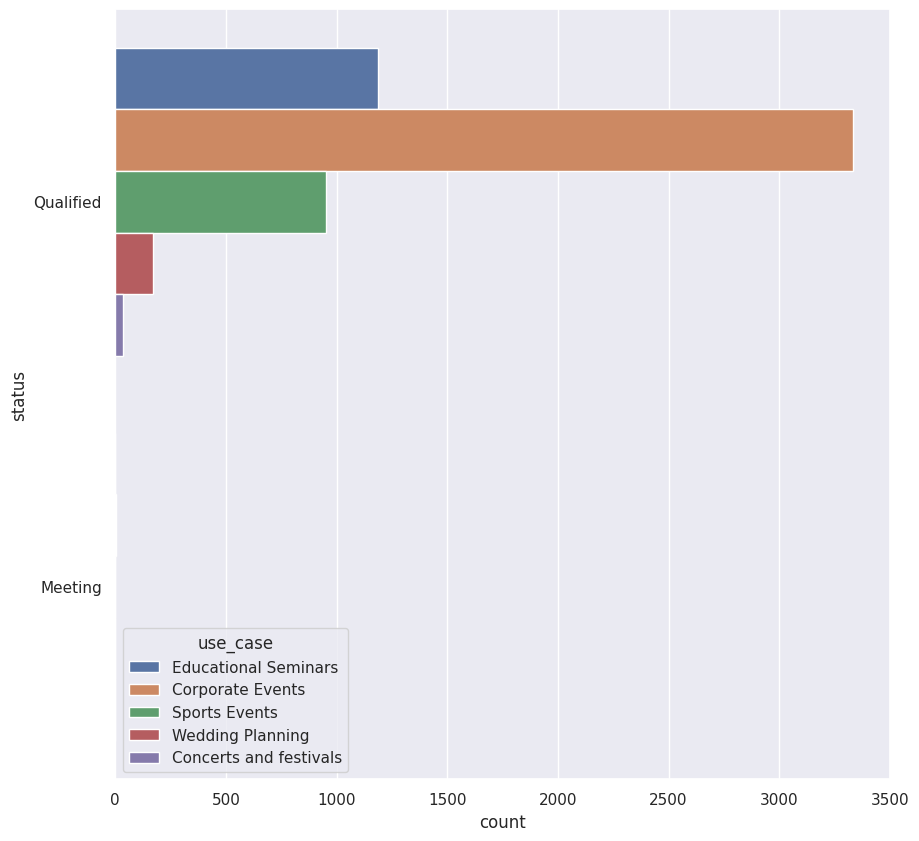

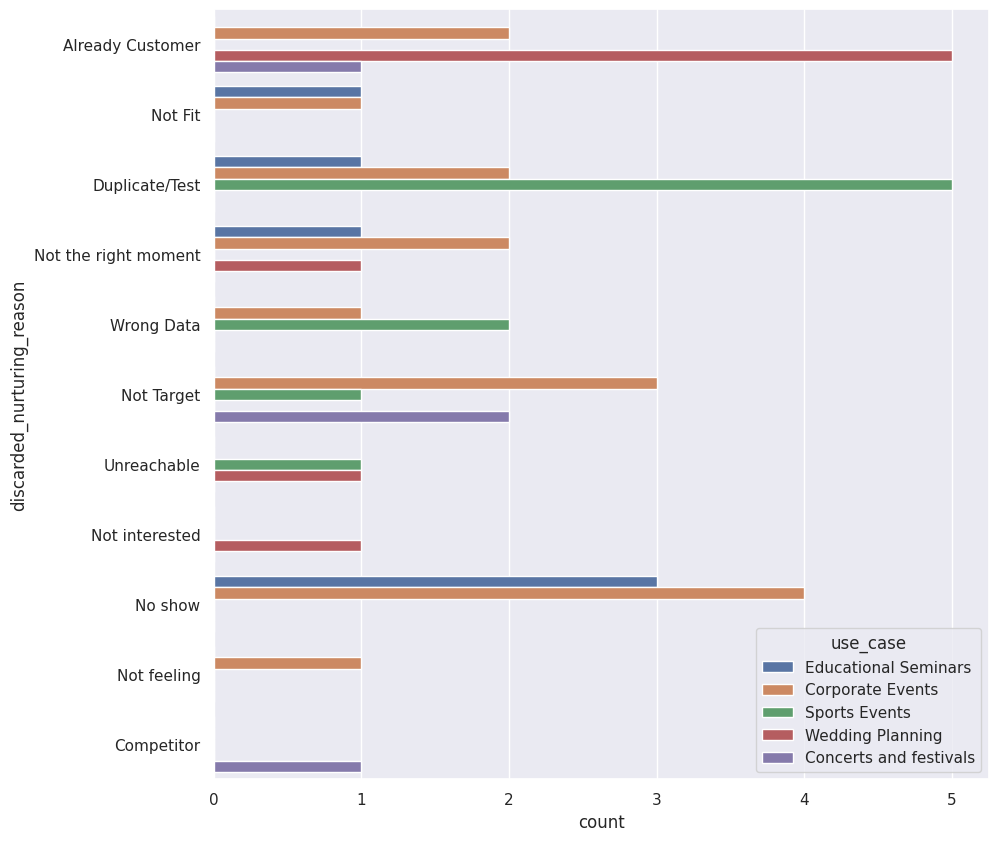

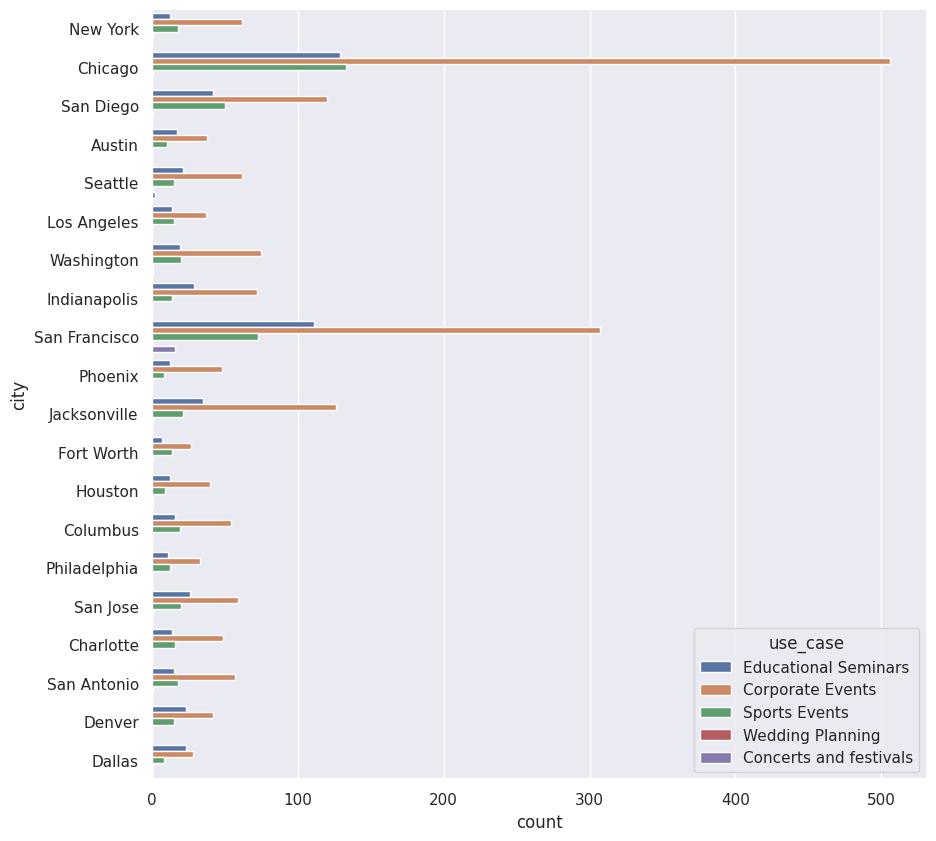

In [98]:
# Graficos de conteo de las variables categoricas reelevantes
variables_categoricas = converted_df.columns[2:].drop(['created_date','acquisition_campaign','converted'])
for variable in variables_categoricas:
  plt.figure(figsize=(10,10))
  sns.countplot(converted_df,y=variable, hue='use_case');
  plt.show();

In [99]:
# Histograma de la variable Acquisition campaign
px.histogram(converted_df,x='acquisition_campaign')

In [100]:
# Histograma de la variable created_date
px.histogram(converted_df,x='created_date')

<p><a name="fechas_leads"></a></p>

## **Filtrado por fechas**

<a href="#leads_df">Volver a Leads_df</a><br>


Con base en el el histograma anterior, se puede notar como los registros de personas convertidas se incrementó considerablemente en el rango de fechas que va desde Jun 9 del 2018, hasta Jan 4 del 2020. Por lo cual, en primera instancia se decidió verificar que información registrada en la base de datos podría explicar el porque de la distribución, no obstante, los datos solo reconfirmaron el perfil del cliente potencial. Por lo tanto, se puede llegar a pensar que dicho incremento en el numero de convertidos se debe a factores externos, agenos a la información suministrada. No obstante, de a cuerdo con la información, los Meetups virtuales es la campaña de adquisición que a dado mejores resultados. Esto ultimo podría ser un deirvado de la pandemia del COVID 19 que se vivió por las fechas en que se concentran los datos. Esto ultimo es consecuente con la informaciín suministrada ya que se han presentado mejores resultados cuando un cliente interezado(Qualified) llega a la empreza en busca se sus producto y servicio y el personal respectivo trabaja con el(Inbound).

In [101]:
# Vista de leads_df sin filtrar
converted_df.sample(10)

,id,first_name,use_case,source,status,discarded_nurturing_reason,acquisition_campaign,created_date,converted,city
25635,8m9psye4,NaN,Corporate Events,Inbound,Qualified,NaN,NaN,2018-09-14,1,Jacksonville
10855,n620n368,NaN,Corporate Events,Inbound,Qualified,NaN,NaN,2018-12-17,1,San Francisco
45026,NaN,Casey13 Harris17,Sports Events,Outbound,Qualified,NaN,NaN,2019-09-11,1,NaN
30553,vqsnciel,NaN,Sports Events,Inbound,Qualified,NaN,NaN,2018-12-29,1,San Francisco
17163,NaN,Riley10 Anderson19,Corporate Events,Inbound,Qualified,NaN,NaN,2018-03-03,1,NaN
29342,co386s9b,Robin17 Jones20,Educational Seminars,Inbound,Qualified,NaN,NaN,2019-05-13,1,Seattle
48656,c41k9d6z,Bailey8 Harris3,Educational Seminars,Inbound,Qualified,NaN,Digital kit 2,2019-11-05,1,NaN
51265,mh176k7u,Morgan15 White8,Sports Events,Outbound,Qualified,NaN,EducationExpo 2,2019-02-06,1,Columbus
31242,odx4didt,Charlie1 Jones5,Educational Seminars,Inbound,Qualified,NaN,NaN,2018-10-09,1,San Diego
1237,knqp2yf1,NaN,Corporate Events,Inbound,Qualified,NaN,NaN,2018-10-24,1,San Francisco


In [102]:
# Ajuste del tipo de datos.
fechas_converted_df = converted_df.astype({'created_date':'datetime64[ns]'})
fechas_converted_df.dtypes

id                                    object
first_name                            object
use_case                              object
source                                object
status                                object
discarded_nurturing_reason            object
acquisition_campaign                  object
created_date                  datetime64[ns]
converted                              int64
city                                  object
dtype: object

In [103]:
# Filtrado por fechas
fechas_converted_df = fechas_converted_df.loc[(fechas_converted_df.created_date >= '2018-05-01') & (fechas_converted_df.created_date <= '2020-01-04')]
fechas_converted_df.sample(10)

,id,first_name,use_case,source,status,discarded_nurturing_reason,acquisition_campaign,created_date,converted,city
55296,xbn7p0s1,Skyler4 Martinez17,Corporate Events,Inbound,Qualified,NaN,NaN,2019-11-23,1,NaN
23400,NaN,NaN,Corporate Events,Inbound,Qualified,NaN,NaN,2018-06-04,1,NaN
48105,l100y560,Jamie2 Taylor4,Sports Events,Inbound,Qualified,NaN,FestivalFever,2019-07-05,1,Fort Worth
54658,2qe4tfyq,Taylor6 Taylor7,Corporate Events,Outbound,Qualified,NaN,VirtualMeetups,2019-11-18,1,Chicago
44819,5zg8t9q2,Riley7 Smith19,Corporate Events,Inbound,Qualified,NaN,VirtualMeetups,2019-09-09,1,Jacksonville
43948,fzku1cz4,Skyler18 Garcia4,Corporate Events,Inbound,Qualified,NaN,VirtualMeetups,2019-05-04,1,NaN
12490,omsfahng,Harper8 Anderson4,NaN,Inbound,Qualified,NaN,NaN,2018-12-27,1,Houston
3777,2cftpdeh,NaN,Corporate Events,Inbound,Qualified,NaN,NaN,2018-06-12,1,Indianapolis
32359,NaN,Drew19 Anderson18,Corporate Events,Inbound,Qualified,NaN,NaN,2018-10-15,1,NaN
58721,p2kptbic,Harper3 White17,Corporate Events,Inbound,Qualified,NaN,VirtualMeetups,2019-12-21,1,NaN


In [104]:
# Estadistica descriptiva de cada variable
variables_categoricas = fechas_converted_df.columns[2:].drop(['converted','created_date'])

for variable in variables_categoricas:
  print(f'{fechas_converted_df[variable].describe()}\n{"-"*60}')

count                 5277
unique                   5
top       Corporate Events
freq                  3054
Name: use_case, dtype: object
------------------------------------------------------------
count        5325
unique          4
top       Inbound
freq         3990
Name: source, dtype: object
------------------------------------------------------------
count          5353
unique            2
top       Qualified
freq           5350
Name: status, dtype: object
------------------------------------------------------------
count                 46
unique                11
top       Duplicate/Test
freq                  10
Name: discarded_nurturing_reason, dtype: object
------------------------------------------------------------
count               1366
unique                45
top       VirtualMeetups
freq                 427
Name: acquisition_campaign, dtype: object
------------------------------------------------------------
count        2798
unique         20
top       Chicago
freq 

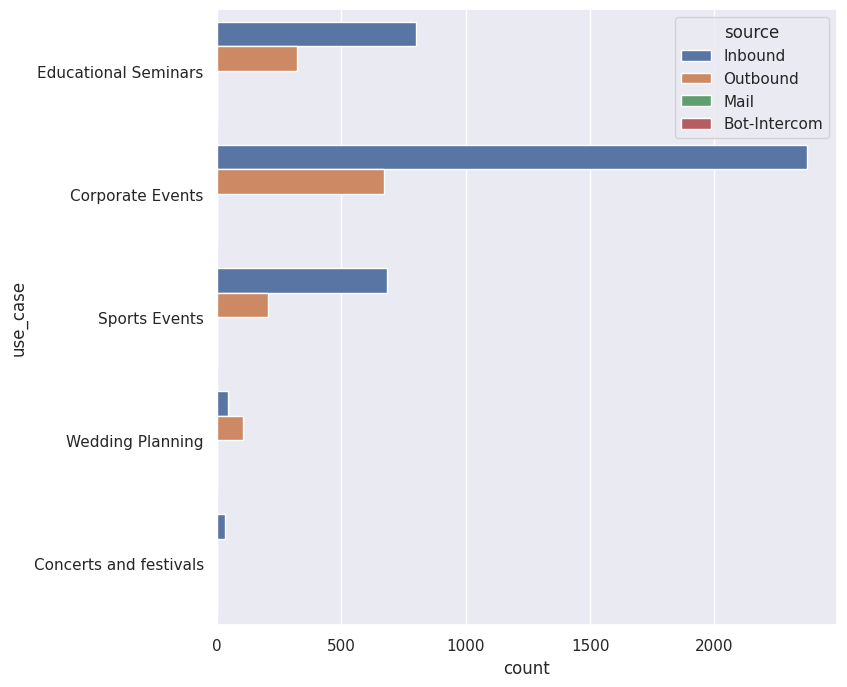

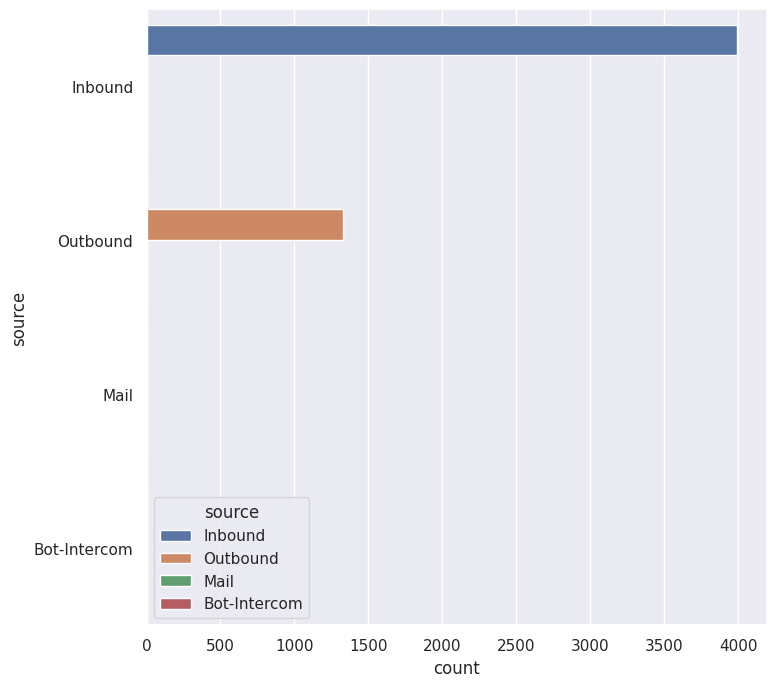

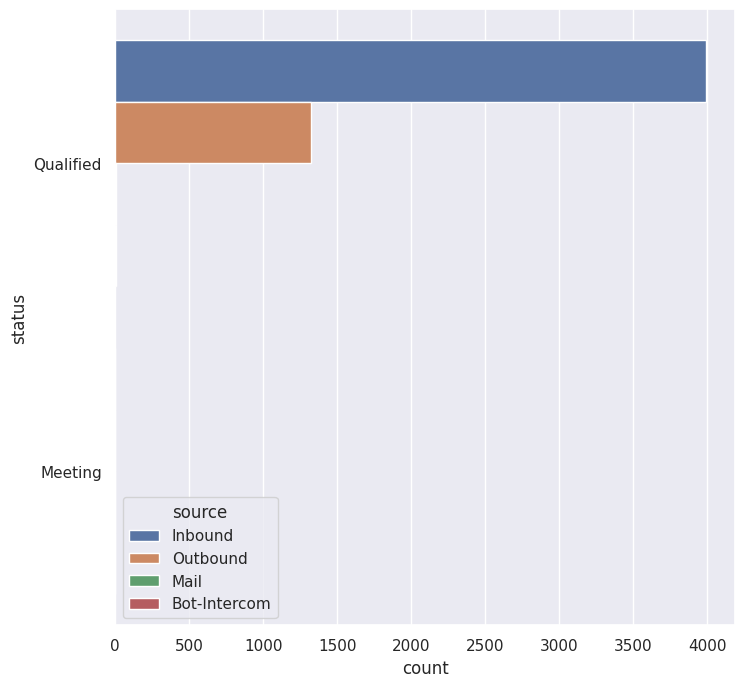

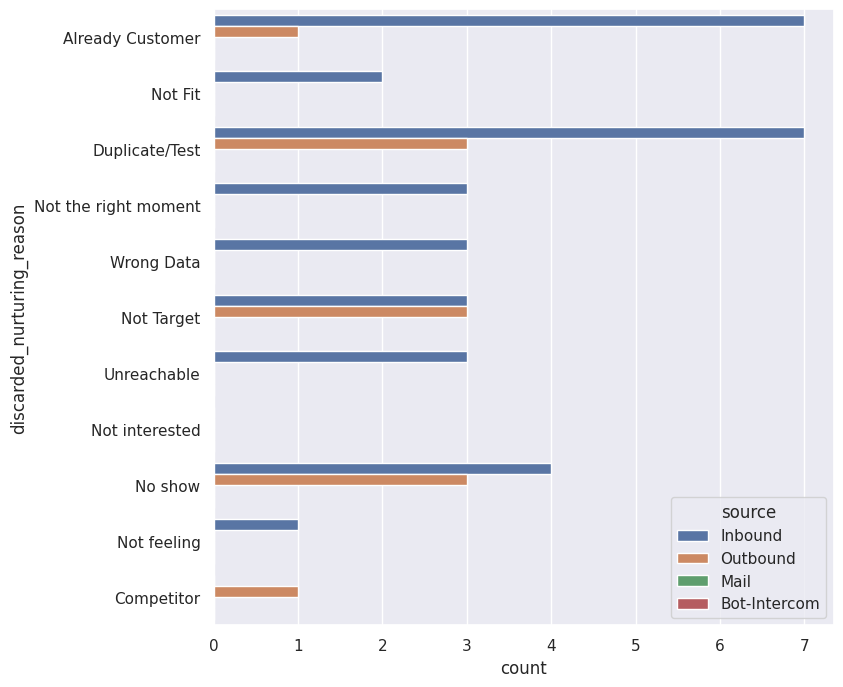

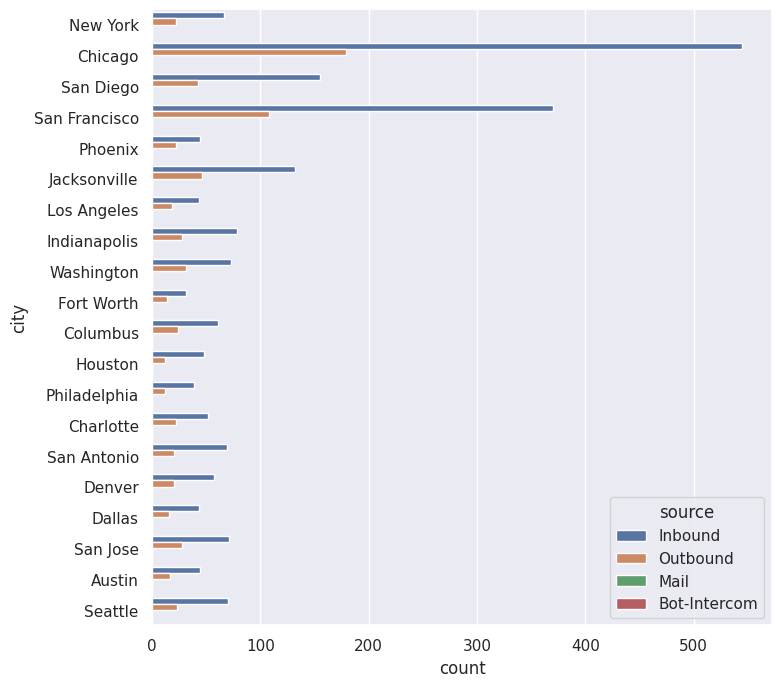

In [105]:
# Graficos de conteo de las variables categoricas reelevante
variables_categoricas = fechas_converted_df.columns[2:].drop(['created_date','acquisition_campaign','converted'])
for variable in variables_categoricas:
  plt.figure(figsize=(8,8))
  sns.countplot(fechas_converted_df,y=variable, hue= 'source');
  plt.show();

<p><a name="rela_var_leads"></a></p>

## **Relación entre variables**

<a href="#leads_df">Volver a Leads_df</a><br>

Una vez identificadas las variables más destacables para el perfil del posible comprador, se procede a identificar la relación entre variables, haciendo uso de tablas de contingencia, y pruevas de hipotesis como la Cramer's V.

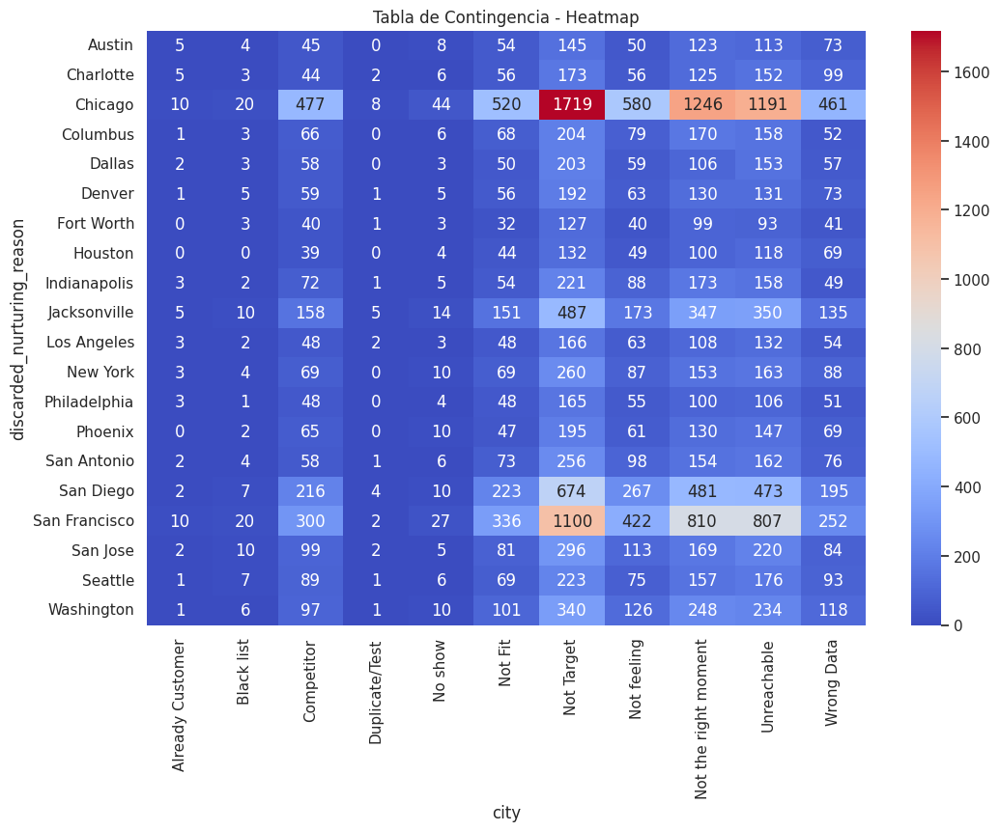

In [106]:
# Mapa de calor de la tabla de contingencia city vs discarded nurturing reason
crosstab_table = pd.crosstab(leads_df.city, leads_df.discarded_nurturing_reason)
plt.figure(figsize=(12, 8))
sns.heatmap(crosstab_table, annot=True, cmap="coolwarm", fmt='d')  # 'annot' para mostrar los valores y 'fmt' para formato
plt.title('Tabla de Contingencia - Heatmap')
plt.xlabel('city')
plt.ylabel('discarded_nurturing_reason')
plt.show()

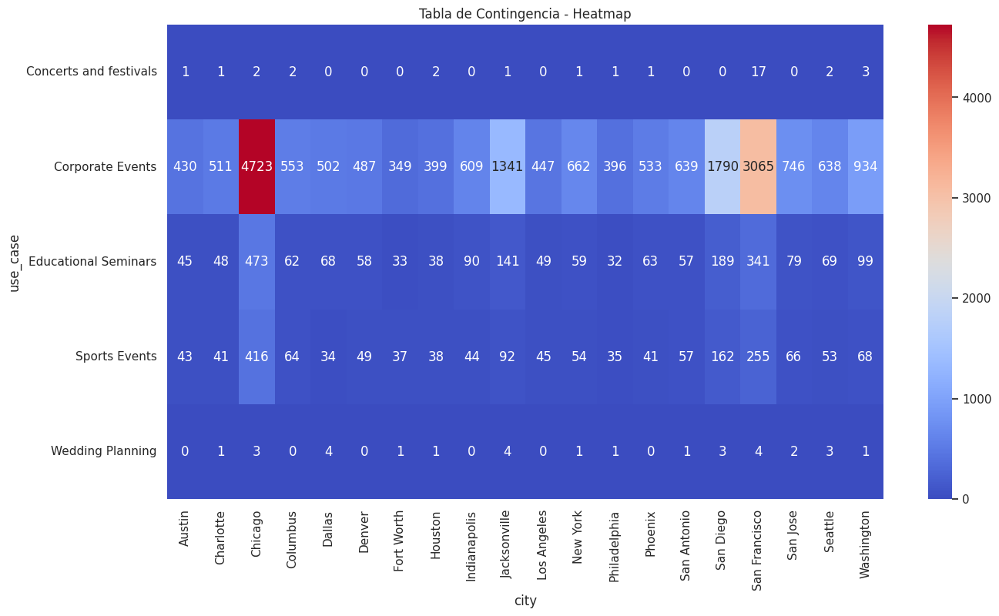

In [107]:
# Mapa de calor de la tabla de contingencia use case vs city
crosstab_table = pd.crosstab(leads_df.use_case, leads_df.city)
plt.figure(figsize=(15, 8))
sns.heatmap(crosstab_table, annot=True, cmap="coolwarm", fmt='d')  # 'annot' para mostrar los valores y 'fmt' para formato
plt.title('Tabla de Contingencia - Heatmap')
plt.xlabel('city')
plt.ylabel('use_case')
plt.show()

In [108]:
# widget cramerv de use_case vs discarded_nurturing_reason
# from mlutilities.eda.multivariant_widget import cramerv_widget
cramerv_widget(fechas_converted_df)

Output()

<p><a name="offers_df"></a></p>

# **Offers_df**

<a href="#contenido">Volver al contenido</a><br>

**Contenido**
- <a href="#offers_AED">Analisis exploratorio</a><br>
- <a href="#var_num">Variables numericas</a><br>
- <a href="#rela_var_offers">Relación entre variables</a><br>


<p><a name="offers_AED"></a></p>

##**Analisis exploratorio**

<a href="#offers_df">Volver a Offers_df</a><br>

Para dar inicio al anális exploratorio (AE) primero se carga el dataset. El analisis de está base de datos contará con muchas similitudes a con el AE llevado a cabo con el primer dataset, no obstante, se decició analizar por sepadaro ambas bases de datos para tener un entenumiento más claro de la información antes de realizar la unión de las bases de datos.

In [109]:
# Carga del dataset Offers
offers_df = pd.read_csv('/content/Copia de offers.csv')
offers_df.head()

,Id,Use Case,Status,Created Date,Close Date,Price,Discount code,Pain,Loss Reason
0,doqyhjtv,Educational Seminars,Closed Won,2019-11-17,2019-11-17,300.0,SAVEMORE50,operations,NaN
1,NaN,Sports Events,Closed Lost,2019-11-24,2019-11-25,150.0,NaN,operations,price
2,NaN,Sports Events,Closed Lost,2019-11-24,2019-11-25,768.0,HALFYEAR20G,operations,no response
3,cturqi48,Corporate Events,Closed Won,2019-05-07,2019-05-07,240.0,DISCOUNT50POWER,financial control,NaN
4,NaN,Sports Events,Closed Lost,2019-11-17,2019-11-25,240.0,SAVEMONTH50G,financial control,no response


Nuevamente se modifican los titulos de las columnas con el fin de que se facilite la escritura del codigo a desarrollar.

In [110]:
# Modificacion de los titulos para ajilizar el analisis
offers_df.columns = offers_df.columns.str.strip().str.lower().str.replace(' ','_')
offers_df.sample(5)

,id,use_case,status,created_date,close_date,price,discount_code,pain,loss_reason
2859,NaN,Educational Seminars,Closed Lost,2019-02-03,2019-02-03,600.0,NaN,quality of delivery,no budget
2843,NaN,Educational Seminars,Closed Lost,2019-09-23,2019-03-05,450.0,SAVEQUARTER25,financial control,lost to competitor
231,xinpbyxr,Sports Events,Checkbox,2020-08-27,2020-10-27,324.0,SLASH10,NaN,NaN
548,NaN,Corporate Events,Negotiation,2020-08-27,2020-08-27,1344.0,YEARLY30PROMO,quality of delivery,NaN
1643,o0fm5jqw,Corporate Events,Closed Won,2018-03-04,2018-03-04,768.0,2SEMESTERS20OFF,operations,NaN


In [111]:
# Cantidad de variables y registros
filas,columnas = offers_df.shape
print(f'Registros: {filas}\nVariables: {columnas}')

Registros: 6130
Variables: 9


In [112]:
# Tipo de datos presentes en el dataset
offers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6130 entries, 0 to 6129
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             4962 non-null   object 
 1   use_case       6093 non-null   object 
 2   status         6130 non-null   object 
 3   created_date   6130 non-null   object 
 4   close_date     6130 non-null   object 
 5   price          5765 non-null   float64
 6   discount_code  4431 non-null   object 
 7   pain           5261 non-null   object 
 8   loss_reason    2364 non-null   object 
dtypes: float64(1), object(8)
memory usage: 431.1+ KB


In [113]:
# Conteo de valores nulos o NaN, en cantidad y en porcentaje
print(f'Numero de valores nulos:\n{offers_df.isna().sum()}\n{"-"*60}\n\nPorcentaje de valores nulos:\n{offers_df.isna().sum()/filas}')

Numero de valores nulos:
id               1168
use_case           37
status              0
created_date        0
close_date          0
price             365
discount_code    1699
pain              869
loss_reason      3766
dtype: int64
------------------------------------------------------------

Porcentaje de valores nulos:
id               0.190538
use_case         0.006036
status           0.000000
created_date     0.000000
close_date       0.000000
price            0.059543
discount_code    0.277162
pain             0.141762
loss_reason      0.614356
dtype: float64


In [114]:
# Visualización de registros duplicados
offers_df[offers_df.duplicated()]

,id,use_case,status,created_date,close_date,price,discount_code,pain,loss_reason
286,NaN,Sports Events,Demo 1,2019-09-07,2020-01-26,NaN,NaN,quality of delivery,NaN
2503,NaN,Corporate Events,Closed Won,2019-11-05,2019-11-05,360.0,MONTHSAVE25DEAL,financial control,NaN
2730,NaN,Corporate Events,Closed Won,2019-11-05,2019-11-05,360.0,MONTHSAVE25DEAL,operations,NaN
2789,NaN,Corporate Events,Closed Won,2019-06-05,2019-06-05,324.0,10OFFREDUCED,financial control,NaN
2824,NaN,Corporate Events,Closed Won,2019-11-05,2019-11-05,360.0,MONTHSAVE25DEAL,operations,NaN
3093,NaN,Educational Seminars,Demo 1,2019-02-06,2020-01-26,NaN,NaN,operations,NaN
4075,NaN,Sports Events,Demo 1,2018-06-05,2018-06-05,NaN,NaN,NaN,NaN
4968,NaN,Wedding Planning,Closed Won,2019-06-16,2019-06-16,NaN,NaN,NaN,NaN
4984,NaN,Wedding Planning,Closed Won,2019-05-11,2019-05-11,NaN,NaN,NaN,NaN
4985,NaN,Wedding Planning,Closed Won,2019-05-11,2019-05-11,NaN,NaN,NaN,NaN


In [115]:
# Eliminación de los duplicados
offers_df.drop_duplicates(inplace=True)
offers_df.sample(5)

,id,use_case,status,created_date,close_date,price,discount_code,pain,loss_reason
24,f071ur84,Corporate Events,Closed Won,2019-11-17,2019-11-17,768.0,2SEMESTERS20OFF,operations,NaN
5155,n4w5gtx0,Corporate Events,Closed Won,2019-06-11,2019-06-11,768.0,2SEMESTERS20OFF,operations,NaN
1419,ikn32tlx,Corporate Events,Closed Lost,2018-04-03,2018-05-03,200.0,NaN,operations,lost to competitor
1918,98pp0lyi,Sports Events,Closed Won,2018-12-17,2018-12-26,240.0,SAVEMONTH50G,operations,NaN
5023,1ix1u9j3,Educational Seminars,Closed Won,2019-03-12,2019-03-20,960.0,YEARLY60,operations,NaN


In [116]:
# Reconteo de duplicados
offers_df.duplicated().value_counts()

False    6076
dtype: int64

In [117]:
# Registros unicos de cada columna
for columna in offers_df.columns:
  print(f'{offers_df[columna].value_counts()}\n{"-"*60}\n')

98pp0lyi    4
anusqayo    2
p5p3jdar    2
d4bsqkru    2
hfgdr40r    2
           ..
82bs7wpz    1
0p02sziz    1
ihcnmia0    1
t6zbsozt    1
9k6zoun6    1
Name: id, Length: 4924, dtype: int64
------------------------------------------------------------

Corporate Events          3483
Educational Seminars      1338
Sports Events             1023
Wedding Planning           193
Concerts and festivals       2
Name: use_case, dtype: int64
------------------------------------------------------------

Closed Won     3201
Closed Lost    2353
Demo 1          206
Negotiation     146
Checkbox        144
Demo 2           26
Name: status, dtype: int64
------------------------------------------------------------

2019-07-24    42
2019-04-23    39
2019-11-25    33
2019-07-23    32
2020-09-26    31
              ..
2018-06-07     1
2019-08-05     1
2019-12-27     1
2019-06-07     1
2019-08-07     1
Name: created_date, Length: 420, dtype: int64
-----------------------------------------------------------

In [118]:
# Estadistica descriptiva de cada columna
variables_categoricas = offers_df.columns[1:].drop(['created_date','close_date'])

for variable in variables_categoricas:
  print(f'{offers_df[variable].describe()}\n{"-"*60}')

count                 6039
unique                   5
top       Corporate Events
freq                  3483
Name: use_case, dtype: object
------------------------------------------------------------
count           6076
unique             6
top       Closed Won
freq            3201
Name: status, dtype: object
------------------------------------------------------------
count      5751.000000
mean       1306.614154
std       10391.416311
min           0.000000
25%         240.000000
50%         360.000000
75%         768.000000
max      399304.000000
Name: price, dtype: float64
------------------------------------------------------------
count                4427
unique                112
top       2SEMESTERS20OFF
freq                  553
Name: discount_code, dtype: object
------------------------------------------------------------
count           5255
unique             4
top       operations
freq            3312
Name: pain, dtype: object
---------------------------------------------

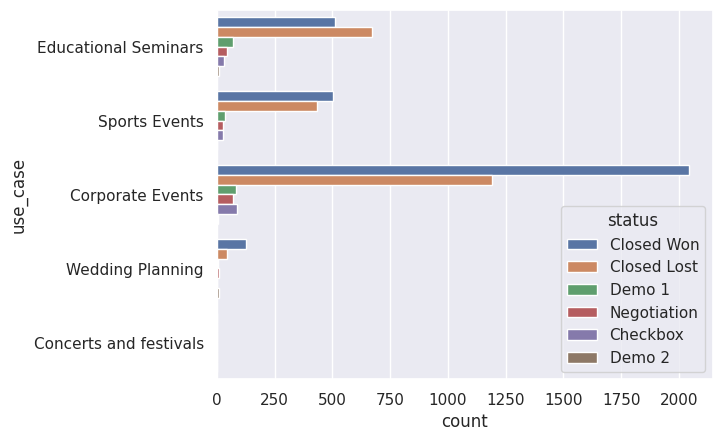

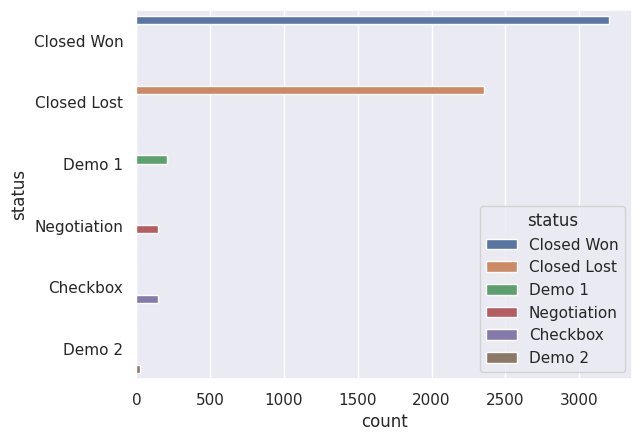

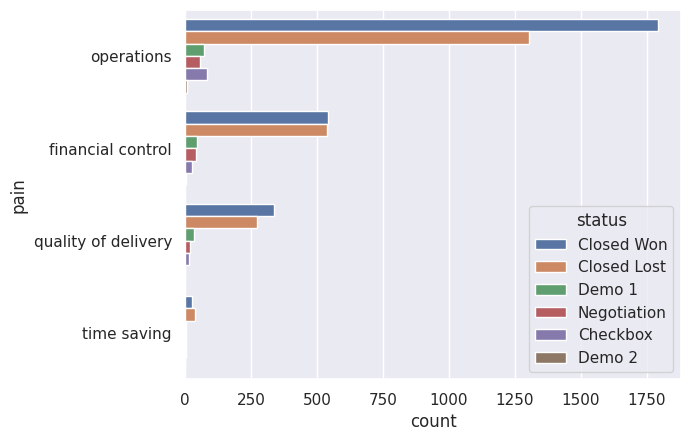

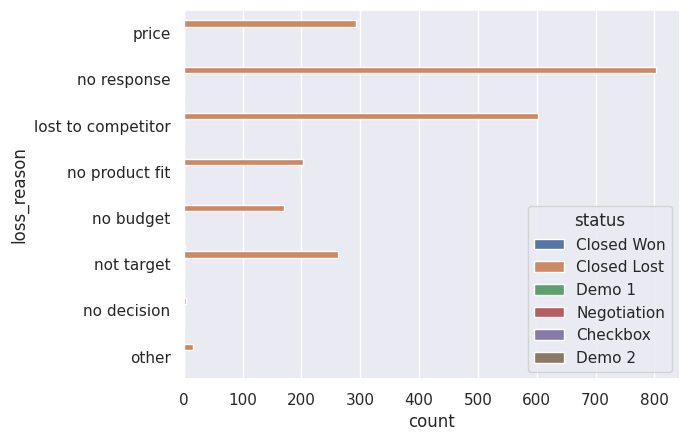

In [119]:
# Graficos de conteo de las variables categoricas reelevantes
variables_categoricas = offers_df.columns.drop(['id','created_date', 'close_date', 'price', 'discount_code'])

for variable in variables_categoricas:
  sns.countplot(offers_df,y=variable, hue='status');
  plt.show();

In [120]:
# Histograma de la variable Disconunt code
px.histogram(offers_df,x='discount_code')

<p><a name="var_num"></a></p>

## **Variables numericas**

<a href="#offers_df">Volver a Offers_df</a><br>

El análisis de la variable "precio" es fundamental en la determinación de la probabilidad de conversión de un cliente potencial. Dicho atributo juega un papel crucial en la toma de decisiones de compra. Explorar en profundidad esta variable es esencial para entender el espectro de precios en el cual se encuentran los potenciales compradores. Además, resulta sumamente interesante examinar el comportamiento de los valores atípicos.

In [121]:
offers_df.sample(5)

,id,use_case,status,created_date,close_date,price,discount_code,pain,loss_reason
5077,5rpvy32n,Educational Seminars,Closed Lost,2019-06-10,2019-06-16,240.0,DISCOUNT50HALF,operations,lost to competitor
1374,NaN,Corporate Events,Closed Lost,2018-03-03,2018-11-03,324.0,NaN,quality of delivery,price
3330,p30p35hk,Corporate Events,Closed Lost,2018-05-06,2018-11-24,240.0,NaN,operations,no response
2792,w3d9xh7v,Educational Seminars,Closed Lost,2019-10-08,2019-10-13,200.0,FLAT30,time saving,lost to competitor
5008,pqy0r892,Corporate Events,Closed Won,2019-06-09,2019-06-09,1344.0,YEARLY30PROMO,operations,NaN


In [122]:
px.histogram(offers_df,'price')

In [123]:
px.scatter(offers_df,x='price')

In [124]:
px.box(offers_df,'price')

In [125]:
# Calcular los cuartiles
precio_df = offers_df.price[~offers_df.price.isna()]

q1 = np.percentile(precio_df, 25)  # Primer cuartil (Q1)
q3 = np.percentile(precio_df, 75)  # Tercer cuartil (Q3)

# Calcular el rango intercuartil (IQR)
iqr = q3 - q1

print(f"q1:{q1}\nq1:{q3}\nRango Intercuartil (IQR): {iqr}")

q1:240.0
q1:768.0
Rango Intercuartil (IQR): 528.0


<p><a name="var_atip"></a></p>

## **Análisis de valores atipicos**

<a href="#offers_df">Volver a Offers_df</a><br>

La identificación y comprensión de los valores atípicos proporcionan información valiosa. Estos puntos destacados pueden representar escenarios excepcionales o anomalías significativas en el comportamiento de compra. Comprender su influencia en la distribución de precios puede ofrecer insights relevantes sobre segmentos específicos de clientes, preferencias excepcionales o condiciones particulares que podrían afectar las decisiones de compra. Estos valores, a pesar de ser atípicos, pueden contener información valiosa que podría impactar estrategias de precios o marketing, por lo que su análisis resulta esencial para una visión integral del comportamiento del consumidor y las posibles oportunidades de negocio.

Este enfoque destaca la relevancia del análisis de valores atípicos en la comprensión de la variable de precio, mostrando cómo su identificación y análisis pueden proporcionar información valiosa para la toma de decisiones estratégicas.

In [126]:
# Estadistica descriptiva de cada columna
precio_df = offers_df.loc[(offers_df.price > 2*iqr)&(offers_df.status == 'Closed Won')]
precio_df.sample(5)

,id,use_case,status,created_date,close_date,price,discount_code,pain,loss_reason
5528,rvo9kuow,Corporate Events,Closed Won,2019-05-14,2019-05-15,1344.0,YEARLY30PROMO,NaN,NaN
2422,educ8k8a,Corporate Events,Closed Won,2019-09-22,2019-09-22,1344.0,YEARLY30PROMO,operations,NaN
731,r0xnm7qj,Corporate Events,Closed Won,2019-11-09,2019-11-10,1344.0,YEARLY30PROMO,NaN,NaN
5082,god5qjit,Educational Seminars,Closed Won,2019-06-28,2019-08-29,1344.0,ANNUAL30BONUS,operations,NaN
1182,s71w2qby,Corporate Events,Closed Won,2018-07-01,2018-06-13,14876.0,ECONOMY75DISCOUNT,operations,NaN


In [127]:
# Cantidad de variables y registros
filas,columnas = precio_df.shape
print(f'Registros: {filas}\nVariables: {columnas}')

Registros: 365
Variables: 9


In [128]:
# Estadistica descriptiva de cada columna
variables_categoricas = precio_df.columns[1:].drop(['created_date','close_date'])

for variable in variables_categoricas:
  print(f'{precio_df[variable].describe()}\n{"-"*60}')

count                  364
unique                   3
top       Corporate Events
freq                   228
Name: use_case, dtype: object
------------------------------------------------------------
count            365
unique             1
top       Closed Won
freq             365
Name: status, dtype: object
------------------------------------------------------------
count       365.000000
mean       6819.172603
std       20305.777342
min        1344.000000
25%        1344.000000
50%        1344.000000
75%        1680.000000
max      264904.000000
Name: price, dtype: float64
------------------------------------------------------------
count               362
unique               27
top       YEARLY30PROMO
freq                158
Name: discount_code, dtype: object
------------------------------------------------------------
count            323
unique             4
top       operations
freq             211
Name: pain, dtype: object
-----------------------------------------------------

<p><a name="rela_var_offers"></a></p>

## **Relación entre variables**

<a href="#offers_df">Volver a Offers_df</a><br>

Para identificar las variables más destacables para el perfil del posible comprador, se procede a identificar la relación entre variables, haciendo uso de tablas de contingencia, y pruevas de hipotesis como la Cramer's V.

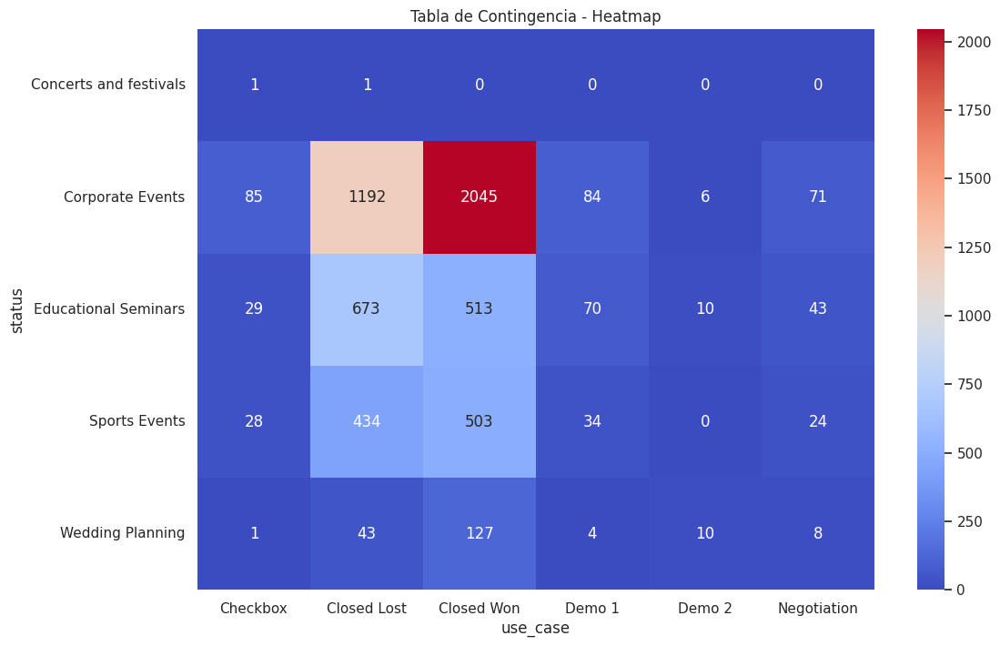

In [129]:
# Mapa de calor de la tabla de contingencia city vs discarded nurturing reason
crosstab_table = pd.crosstab(offers_df.use_case, offers_df.status)
plt.figure(figsize=(12, 8))
sns.heatmap(crosstab_table, annot=True, cmap="coolwarm", fmt='d')  # 'annot' para mostrar los valores y 'fmt' para formato
plt.title('Tabla de Contingencia - Heatmap')
plt.xlabel('use_case')
plt.ylabel('status')
plt.show()

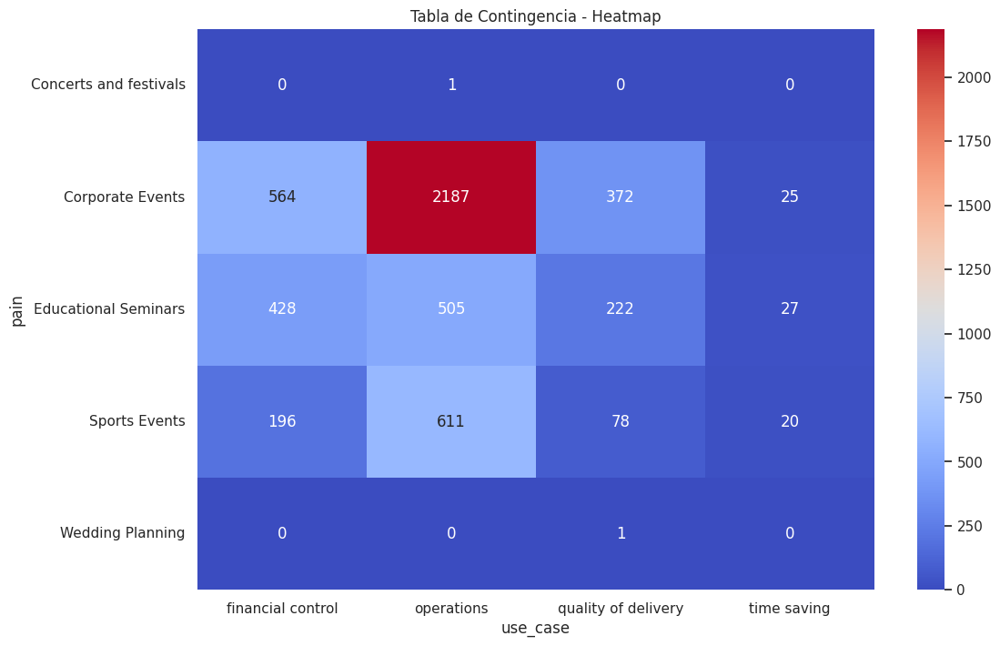

In [130]:
# Mapa de calor de la tabla de contingencia city vs discarded nurturing reason
crosstab_table = pd.crosstab(offers_df.use_case, offers_df.pain)
plt.figure(figsize=(12, 8))
sns.heatmap(crosstab_table, annot=True, cmap="coolwarm", fmt='d')  # 'annot' para mostrar los valores y 'fmt' para formato
plt.title('Tabla de Contingencia - Heatmap')
plt.xlabel('use_case')
plt.ylabel('pain')
plt.show()

In [131]:
# widget cramerv de use_case vs discarded_nurturing_reason
cramerv_widget(offers_df)

Output()

<p><a name="union"></a></p>

# **Unión de las bases de datos**

<a href="#contenido">Volver al contenido</a><br>


Ahora que se ha clarificado el contexto de cada base de datos y se ha comprendido el significado de las variables en los registros respectivos, procedemos a la unión de los datasets. Esto permitirá entrenar un modelo que abarque desde los clientes potenciales que hayan asistido al menos a la primera demostración hasta aquellos que finalmente hayan adquirido el producto.

Esta unificación de datasets posibilita una visión completa del proceso, desde la etapa inicial con los clientes potenciales hasta la etapa de conversión. Al considerar todo el recorrido del cliente, desde su interacción inicial hasta su conversión, el modelo podrá capturar y aprender patrones relevantes que pueden influir en la efectividad de las estrategias de conversión. Integrar estos datos diversos permitirá una comprensión más holística y precisa del comportamiento del cliente a lo largo de su trayectoria, brindando una base sólida para el entrenamiento del modelos


In [132]:
# Visualización de algunos registros de leads_df
leads_df.sample(5)

,id,first_name,use_case,source,status,discarded_nurturing_reason,acquisition_campaign,created_date,converted,city
50475,NaN,Reese9 Jackson5,Sports Events,Inbound,Discarded,Not Target,NaN,2019-10-20,0,NaN
13153,7yx904dm,NaN,NaN,Inbound,Discarded,Not Target,NaN,2019-03-27,0,San Diego
164,183h7nbc,Jamie19 Robinson2,Corporate Events,Inbound,Discarded,Not Target,NaN,2019-04-28,0,San Francisco
32523,jr2b3w7f,NaN,Sports Events,Inbound,Qualified,NaN,NaN,2018-10-16,1,Denver
40220,NaN,Drew4 Miller12,NaN,NaN,Nurturing,Not the right moment,TechEvent,2019-07-23,0,NaN


In [133]:
# Cantidad de variables y registros
filas,columnas = leads_df.shape
print(f'Registros: {filas}\nVariables: {columnas}')

Registros: 60063
Variables: 10


In [134]:
# Visualización de algunos registros de offers_df
offers_df.sample(5)

,id,use_case,status,created_date,close_date,price,discount_code,pain,loss_reason
4020,pm6irehj,Corporate Events,Closed Lost,2019-09-26,2019-01-16,360.0,NOCOSTREG,operations,no response
3028,6urk46d4,Sports Events,Closed Lost,2019-10-21,2019-10-21,576.0,2SEMESTERS20SALE,operations,lost to competitor
1441,smefmplb,Corporate Events,Closed Lost,2018-07-22,2018-08-14,360.0,SAVE25LESS,financial control,no response
4902,1iwkps9i,Corporate Events,Closed Won,2019-05-20,2019-05-20,360.0,MONTHSAVE25DEAL,time saving,NaN
968,3pteegk9,Corporate Events,Closed Won,2018-12-03,2018-12-03,360.0,SAVE25LESS,financial control,NaN


In [135]:
# Cantidad de variables y registros
filas,columnas = offers_df.shape
print(f'Registros: {filas}\nVariables: {columnas}')

Registros: 6076
Variables: 9


Dado que hay una marcada disparidad en la cantidad de registros entre leads_df y offers_df, es relevante indagar en el número de id compartidos entre ambos conjuntos de datos. Esta evaluación nos permitirá determinar si es pertinente fusionar ambas bases, considerando tanto la cantidad de registros coincidentes como la calidad de la información resultante.

Identificar el número de IDs comunes entre los datasets es crucial para evaluar si la fusión proporcionará datos significativos y útiles. Evaluar la coincidencia nos brinda información sobre la posible superposición de clientes potenciales o información relevante que puede enriquecer el análisis. Además, la calidad de esta información resultante será clave para decidir si la fusión generará un conjunto de datos robusto y valioso para los análisis subsiguientes.

In [136]:
# Contar elementos comunes
cantidad_comunes = leads_df.id.isin(offers_df.id).sum()

print(f"Cantidad de elementos comunes: {cantidad_comunes}")

Cantidad de elementos comunes: 19865


In [137]:
#Descarte de resitros nulos segun la columna id
id_leads_df = leads_df[leads_df.id.isin(leads_df.id.dropna())]
id_leads_df.sample(5)

,id,first_name,use_case,source,status,discarded_nurturing_reason,acquisition_campaign,created_date,converted,city
39665,sjhghst5,Jamie19 Wilson17,Corporate Events,Outbound,Discarded,Not Target,NaN,2019-07-20,0,San Jose
12044,n394l24x,Alex6 Jones14,Corporate Events,Inbound,Discarded,Not Target,NaN,2019-04-29,0,NaN
52325,c5fc2fqv,Casey13 Martin11,NaN,Outbound,Nurturing,Competitor,NaN,2019-10-06,0,NaN
56422,737p5a83,Charlie13 Harris19,Corporate Events,Outbound,Called,NaN,Digital kit,2019-06-07,0,NaN
20636,ox3hgylk,Devon3 Martin16,Corporate Events,Outbound,Discarded,Not feeling,Follow-up: digital guide,2019-04-17,0,NaN


In [138]:
#Descarte de resitros nulos segun la columna id
id_offers_df = offers_df[offers_df.id.isin(offers_df.id.dropna())]
id_offers_df.sample(5)

,id,use_case,status,created_date,close_date,price,discount_code,pain,loss_reason
3216,t2c9i5xq,Corporate Events,Closed Won,2018-04-06,2018-05-06,760.0,2SEMESTERS20OFF,quality of delivery,NaN
1686,gwc6ztds,Sports Events,Closed Won,2018-10-06,2018-11-10,768.0,HALFYEAR20G,operations,NaN
2157,0wo84ufm,Corporate Events,Closed Won,2019-10-16,2019-10-19,768.0,2SEMESTERS20OFF,financial control,NaN
6028,apuhh5tf,Educational Seminars,Closed Won,2019-05-08,2019-05-08,1680.0,FLAT30,operations,NaN
1184,11jwprl1,Corporate Events,Closed Lost,2018-06-13,2018-06-20,240.0,DISCOUNT50POWER,operations,other


In [139]:
# Contar elementos comunes
cantidad_comunes = id_leads_df.id.isin(id_offers_df.id).sum()

print(f"Cantidad de elementos comunes: {cantidad_comunes}")

Cantidad de elementos comunes: 3774


In [140]:
# Unir los DataFrames usando la columna 'id'
leads_offers_df = pd.merge(id_leads_df, id_offers_df, on='id', how='inner')
leads_offers_df.sample(10)

,id,first_name,use_case_x,source,status_x,discarded_nurturing_reason,acquisition_campaign,created_date_x,converted,city,use_case_y,status_y,created_date_y,close_date,price,discount_code,pain,loss_reason
1814,jmmfbpk7,Harper17 Brown10,Educational Seminars,Inbound,Qualified,NaN,NaN,2019-10-31,1,NaN,Educational Seminars,Closed Lost,2019-06-12,2019-06-25,150.0,NaN,quality of delivery,no response
1012,qdtlxa7a,Frankie14 Jackson12,Corporate Events,Inbound,Qualified,NaN,NaN,2019-11-26,1,NaN,Corporate Events,Closed Won,2019-11-26,2019-11-26,240.0,MONTH50REBATE,financial control,NaN
3494,nhnar152,Avery5 Davis8,Educational Seminars,Outbound,Qualified,NaN,NaN,2019-11-23,1,NaN,Educational Seminars,Closed Won,2019-11-23,2019-11-24,960.0,YEARLY60,operations,NaN
225,xzxv8npl,Robin8 Garcia5,Educational Seminars,Inbound,Qualified,NaN,NaN,2018-06-09,1,NaN,Educational Seminars,Closed Lost,2018-06-10,2018-06-16,200.0,NaN,operations,lost to competitor
767,w1iblb8j,NaN,Corporate Events,Inbound,Qualified,NaN,NaN,2018-12-23,1,Indianapolis,Corporate Events,Closed Won,2018-12-24,2018-12-24,576.0,2SEMESTERS20SALE,operations,NaN
1324,e0usulpf,Drew11 Williams20,Corporate Events,Inbound,Qualified,NaN,NaN,2018-08-12,1,NaN,Corporate Events,Closed Lost,2018-08-13,2018-08-14,200.0,YEARLY30PROMO,NaN,lost to competitor
3722,mzehvk9a,Bailey6 Taylor18,NaN,Outbound,New,NaN,NaN,2019-12-25,0,Columbus,Sports Events,Closed Won,2019-11-09,2019-12-25,960.0,YEARLY60,operations,NaN
1606,hwngncbe,Alex13 Wilson8,Corporate Events,Inbound,Qualified,NaN,NaN,2018-10-04,1,Denver,Corporate Events,Closed Lost,2018-09-08,2018-09-25,240.0,NaN,operations,no response
292,hp4xf6xd,NaN,Educational Seminars,Inbound,Qualified,NaN,NaN,2018-12-06,1,Jacksonville,Educational Seminars,Negotiation,2018-11-11,2018-11-11,1344.0,NaN,financial control,NaN
1289,5hw4lyal,NaN,Corporate Events,Inbound,Qualified,NaN,NaN,2018-08-08,1,Chicago,Corporate Events,Closed Lost,2018-08-21,2018-08-26,240.0,DISCOUNT50POWER,time saving,no response


In [141]:
# Cantidad de variables y registros
filas,columnas = leads_offers_df.shape
print(f'Registros: {filas}\nVariables: {columnas}')

Registros: 3801
Variables: 18


In [142]:
# Porcentaje de regisgros nulos presentes en cada columna
leads_offers_df.isna().sum()/filas

id                            0.000000
first_name                    0.218100
use_case_x                    0.017101
source                        0.000526
status_x                      0.000000
discarded_nurturing_reason    0.991318
acquisition_campaign          0.725599
created_date_x                0.000000
converted                     0.000000
city                          0.336753
use_case_y                    0.005788
status_y                      0.000000
created_date_y                0.000000
close_date                    0.000000
price                         0.027624
discount_code                 0.248093
pain                          0.102341
loss_reason                   0.594054
dtype: float64

Basándonos en la información previa, procedemos a eliminar aquellas columnas que contienen una alta proporción de valores nulos o ausentes.

Este descarte de columnas con una mayoría de datos faltantes es fundamental para mantener la calidad y relevancia de los datos restantes. Al eliminar estas columnas con poca información útil, optimizamos el conjunto de datos para análisis posteriores, focalizándonos en atributos más completos y significativos para nuestras investigaciones o modelos. Esta depuración ayuda a mantener la integridad y utilidad de la información disponible para su análisis.

In [143]:
# Descarte de la variables con exeso de datos nulos.
data_modelo_df = leads_offers_df.drop([
    'id',
    'first_name',
    'use_case_x',
    'discarded_nurturing_reason',
    'acquisition_campaign',
    'created_date_x',
    'created_date_y',
    'close_date',
    'loss_reason'
]
                                      ,axis=1)

data_modelo_df.sample(5)

,source,status_x,converted,city,use_case_y,status_y,price,discount_code,pain
1770,Inbound,Qualified,1,New York,Sports Events,Closed Lost,360.0,NaN,financial control
3138,Inbound,Qualified,1,Denver,Corporate Events,Closed Lost,576.0,HOT25SAVING,operations
2781,Inbound,Qualified,1,NaN,Corporate Events,Closed Lost,360.0,SAVE25LESS,financial control
1955,Inbound,Qualified,1,Chicago,Corporate Events,Closed Lost,240.0,DISCOUNT50POWER,financial control
3442,Inbound,Qualified,1,Chicago,Corporate Events,Closed Lost,240.0,MONTH50REBATE,financial control


<p><a name="modelo"></a></p>

# **Modelo.**

<a href="#contenido">Volver al contenido</a><br>

A continuación, se exhibe un modelo predictivo fundamentado en árboles de decisión. Este modelo es entrenado utilizando los datos preprocesados anteriormente, pasando por un proceso de validación cruzada y ajuste de hiperparámetros. Finalmente, se presenta la puntuación de precisión obtenida por el modelo.

Este enfoque de modelado ofrece una visión integral del rendimiento del modelo predictivo. A través de la validación cruzada y el ajuste de hiperparámetros, se busca maximizar la precisión del modelo, permitiendo una evaluación robusta de su capacidad predictiva. La puntuación de precisión resultante ofrece un indicador crucial para comprender la eficacia y fiabilidad del modelo en la predicción de resultados.

In [144]:
#Datos del modelo
data_modelo_df.sample(5)

,source,status_x,converted,city,use_case_y,status_y,price,discount_code,pain
921,Inbound,Qualified,1,San Jose,Corporate Events,Closed Lost,200.0,NaN,operations
1667,Inbound,Qualified,1,NaN,Corporate Events,Closed Lost,768.0,2SEMESTERS20OFF,operations
3551,Outbound,Qualified,1,Chicago,Educational Seminars,Closed Won,360.0,DISCOUNT25QUICK,financial control
1763,Inbound,Qualified,1,Phoenix,Corporate Events,Closed Won,240.0,MONTH50REBATE,operations
3171,Inbound,Qualified,1,San Francisco,Educational Seminars,Closed Won,1344.0,ANNUAL30BONUS,quality of delivery


In [145]:
# Matriz de caracteristicas/ variable a predecir
X = data_modelo_df.drop('status_y',axis=1)
y = data_modelo_df.status_y

# Dividir datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ColumnTransformer para manejar columnas numéricas y categóricas
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X.select_dtypes(include=['object']).columns.tolist()

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Crear el pipeline con el clasificador DecisionTree
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('classifier', DecisionTreeClassifier())])

# Parámetros para el GridSearchCV
param_grid = {
    'classifier__max_depth': [1, 5, 10, 15],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# Validación cruzada usando GridSearchCV
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(pipeline, param_grid, cv=kf)
grid_search.fit(X_train, y_train)

# Mejores parámetros y mejor puntuación
print(f"Mejores parámetros: {grid_search.best_params_}")
print(f"Puntaje de entrenamiento del mejor modelo: {grid_search.best_score_}")

# Evaluar el mejor modelo en el conjunto de prueba
best_model = grid_search.best_estimator_
test_score = best_model.score(X_test, y_test)
print(f"Puntaje en conjunto de prueba: {test_score}")


Mejores parámetros: {'classifier__max_depth': 5, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 10}
Puntaje de entrenamiento del mejor modelo: 0.7213815789473685
Puntaje en conjunto de prueba: 0.7227332457293035



Como se puede notar, la calidad y cantidad de los datos tienen un impacto crucial en la capacidad predictiva de un modelo. La calidad se refiere a la precisión, integridad y relevancia de los datos; datos imprecisos, incompletos o sesgados pueden llevar a predicciones erróneas o menos precisas. La cantidad de datos influye en la capacidad del modelo para capturar patrones subyacentes: conjuntos pequeños pueden resultar en sobreajuste, mientras que conjuntos grandes tienden a mejorar la generalización. Un conjunto de datos robusto y amplio, con datos precisos y relevantes, tiende a mejorar la capacidad predictiva del modelo, permitiendo que capture patrones más representativos y haga predicciones más precisas sobre datos nuevos.

<p><a name="sdk"></a></p>

# **SDK**

<a href="#contenido">Volver al contenido</a><br>

Durante el desarrollo del SDK, surgieron varios desafíos debido a la incompatibilidad de la biblioteca Shimoku-api-python con Windows. La librería, lamentablemente, solo es compatible con entornos Linux, lo que imposibilita su ejecución en Colab. A pesar de ello, se proporciona evidencia del funcionamiento del código cuando se ejecuta en un entorno Ubuntu.

Esta limitación de compatibilidad entre sistemas operativos ha obstaculizado la demostración del funcionamiento del código en entornos como Colab, pero se ofrece una muestra de su ejecución exitosa en un entorno Ubuntu, lo que demuestra su operatividad y funcionamiento satisfactorio bajo la configuración específica de Linux.

In [146]:
from os import getenv
import shimoku_api_python as Shimoku
from dotenv import load_dotenv

# import .env
load_dotenv()

access_token: str = getenv('SHIMOKU_TOKEN')
universe_id: str = getenv('UNIVERSE_ID')
workspace_id: str = getenv('WORKSPACE_ID')

s = Shimoku.Client(
    access_token=access_token,
    universe_id=universe_id,
    verbosity='INFO'
)

# print(s._dict_)
s.set_workspace(uuid=workspace_id)

s.set_board('Custom Board')

s.set_menu_path('catalog', 'bar-example')

language_expressiveness = [
    {'Language': 'C', 'Statements ratio': 1.0, 'Lines ratio': 1.0},
    {'Language': 'C++', 'Statements ratio': 2.5, 'Lines ratio': 1.0},
    {'Language': 'Fortran', 'Statements ratio': 2.0, 'Lines ratio': 0.8},
    {'Language': 'Java', 'Statements ratio': 2.5, 'Lines ratio': 1.5},
    {'Language': 'Perl', 'Statements ratio': 6.0, 'Lines ratio': 6.0},
    {'Language': 'Smalltalk', 'Statements ratio': 6.0, 'Lines ratio': 6.25},
    {'Language': 'Python', 'Statements ratio': 6.0, 'Lines ratio': 6.5},
]

s.plt.bar(
    order=0, title='Language expressiveness',
    data=language_expressiveness, x='Language',
    y=['Statements ratio', 'Lines ratio'],
)

ModuleNotFoundError: ignored

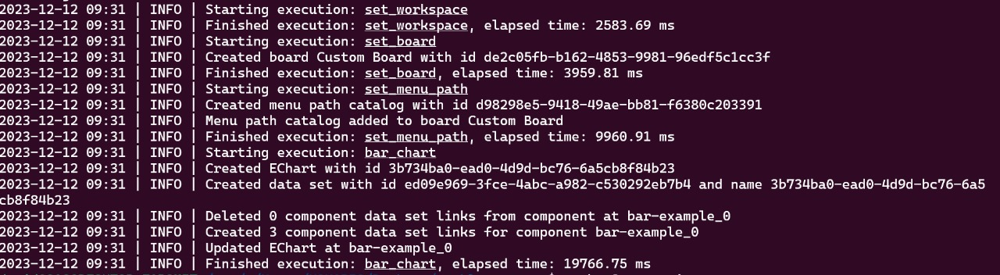

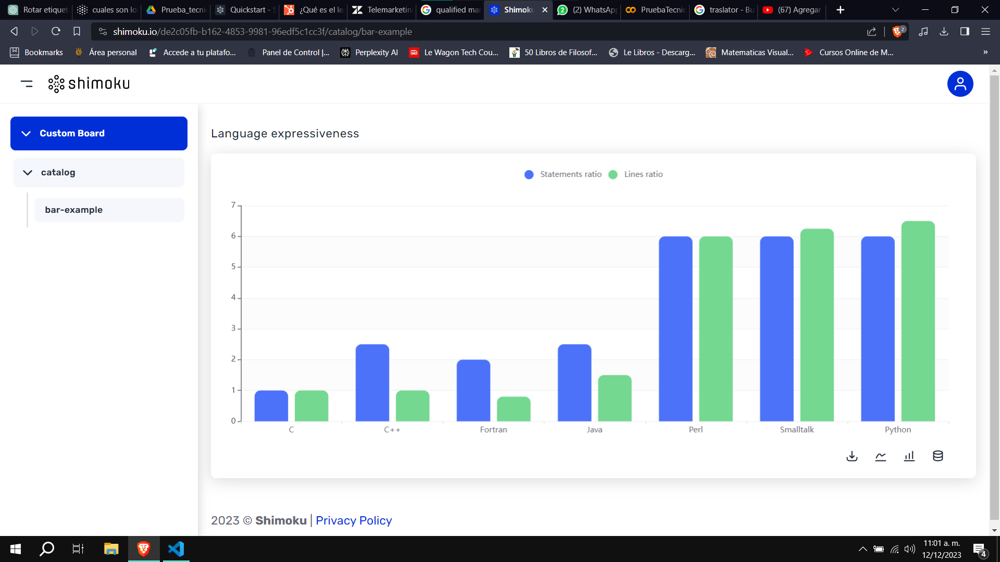

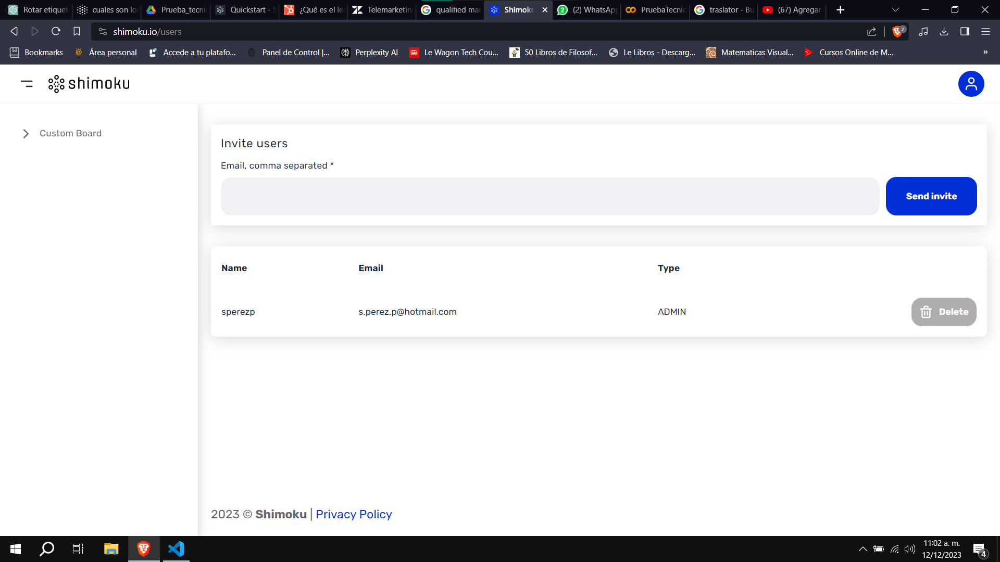